In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import cv2
import albumentations as A
import random
import json
from PIL import Image
import os
from torch.utils.data import Dataset, DataLoader
import torch, torchvision
import warnings
import sys
from skimage import io
import numpy as np
import pandas as pd
from tqdm.notebook import tqdm

warnings.filterwarnings("ignore")
import ipywidgets as widgets
from ipywidgets import interact, interact_manual
import shutil
from tqdm import tqdm
from matplotlib import pyplot as plt
import torch.optim as optim
import torchvision
import collections
from torchvision import datasets, models, transforms

# import paddle

In [ ]:
# !python ppdet/modeling/tests/test_architectures.py

In [ ]:
import torch
from torch import nn

# If there's a GPU available...
if torch.cuda.is_available():    

    # Tell PyTorch to use the GPU.    
    device = torch.device("cuda")

    print('There are %d GPU(s) available.' % torch.cuda.device_count())

    print('We will use the GPU:', torch.cuda.get_device_name(0))

# If not...
else:
    print('No GPU available, using the CPU instead.')
    device = torch.device("cpu")

In [ ]:
4# data_dir = '/content/drive/MyDrive/НТИ ИИ /data_team/'
project_dir = '/content/drive/MyDrive/НТИ ИИ /'
data_dir = 'data'
train_images = 'data/train_recognition/images'
image_size = 256
first_size = 512

# Settings

In [ ]:
!unzip -q '/content/drive/MyDrive/НТИ ИИ /data_team/data_final.zip'

In [ ]:
%%shell

# Download TorchVision repo to use some files from
# references/detection
git clone https://github.com/pytorch/vision.git
cd vision
git checkout v0.3.0

cp references/detection/utils.py ../
cp references/detection/transforms.py ../
cp references/detection/coco_eval.py ../
cp references/detection/engine.py ../
cp references/detection/coco_utils.py ../

Cloning into 'vision'...
remote: Enumerating objects: 99905, done.
remote: Counting objects: 100% (35036/35036), done.
remote: Compressing objects: 100% (2810/2810), done.
remote: Total 99905 (delta 32372), reused 34412 (delta 32043), pack-reused 64869
Receiving objects: 100% (99905/99905), 197.74 MiB | 13.99 MiB/s, done.
Resolving deltas: 100% (85447/85447), done.
Note: checking out 'v0.3.0'.

You are in 'detached HEAD' state. You can look around, make experimental
changes and commit them, and you can discard any commits you make in this
state without impacting any branches by performing another checkout.

If you want to create a new branch to retain commits you create, you may
do so (now or later) by using -b with the checkout command again. Example:

  git checkout -b <new-branch-name>

HEAD is now at be376084d version check against PyTorch's CUDA version


# Building datasets

### Load annotations

In [ ]:
annotation = pd.read_csv('data/train_recognition/labels.csv')

In [ ]:
import json

with open(data_dir+'/train_segmentation/annotations.json') as f:
    seg_annotations = json.load(f)

In [ ]:
from sklearn.model_selection import train_test_split

val_annot = seg_annotations.copy()
train_annot = seg_annotations.copy()

train_annot['images'], val_annot['images']  = train_test_split(seg_annotations['images'], test_size=0.1, random_state=42)

In [ ]:
with open(os.path.join(data_dir, 'train_segmentation/annotations_val.json'), 'w') as outfile:
    json.dump(val_annot, outfile)
    
    
with open(os.path.join(data_dir, 'train_segmentation/annotations_train.json'), 'w') as outfile:
    json.dump(train_annot, outfile)

In [ ]:
collections.Counter([(el['height'], el['width']) for el in seg_annotations['images']]).most_common()

[((3024, 4032), 398),
 ((3000, 4000), 219),
 ((4032, 3024), 173),
 ((1960, 4032), 74),
 ((4000, 3000), 35),
 ((3999, 2999), 29),
 ((3900, 3000), 1),
 ((3797, 2959), 1),
 ((3815, 2999), 1),
 ((3815, 2930), 1)]

### define dataset

In [ ]:
def numbers2coords(list_of_numbers):
    """Convert list of numbers to list of tuple coords x, y."""
    bbox = [
        [list_of_numbers[i], list_of_numbers[i + 1]]
        for i in range(0, len(list_of_numbers), 2)
    ]
    return np.array(bbox)

In [ ]:
def get_data_from_image(data, image_id):
    texts = []
    polygons = []
    for idx, data_ann in enumerate(data["annotations"]):
        if (
            data_ann["image_id"] == image_id
            and data_ann["attributes"]
            and data_ann["attributes"]["translation"]
            and data_ann["segmentation"]
        ):
            polygon = numbers2coords(data_ann["segmentation"][0])
            polygons.append(polygon)
            texts.append(data_ann["attributes"]["translation"])
    return texts, polygons

In [ ]:
from shapely.geometry import Polygon
from albumentations.pytorch.transforms import ToTensor
import albumentations as A


class SegDataset(Dataset):
    def __init__(self, img_folder, data, transforms):
        self.img_folder = img_folder
        self.data = data
        self.transforms = transforms

    def __len__(self):
        return len(self.data['images'])
    
    def _load_file(self, path):
        image = cv2.imread(path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        return image

    def __getitem__(self, idx):
        data_img = self.data['images'][idx]
        img_name = data_img["file_name"]
        image_id = data_img["id"]
        image = self._load_file(os.path.join(self.img_folder, img_name))

        texts_from_image, polygons_from_image = get_data_from_image(self.data, image_id)

        masks = []
        mask = np.zeros_like(image)
        used = [(0, 0, 0)]
        for i, polygon in enumerate(polygons_from_image):
          polygon = np.array([[int(el[0]), int(el[1])] for el in polygon])
          color = (0, 0, 0)
          while color in used:
            color = (random.randint(0, 255), random.randint(0, 255), random.randint(0, 255))
          used.append(color)
          cv2.drawContours(mask, [polygon], -1, color=color, thickness=cv2.FILLED)

        transformed = self.transforms(image=image, mask=mask)
        image = transformed['image']
        mask = (transformed['mask'].squeeze() * 255).astype(np.uint8)
        # plt.imshow(mask)
        # plt.show()
        # print(image.shape, mask.shape)

        obj_ids = np.unique(mask.reshape(-1, 3), axis=0)
        obj_ids = np.array([el for el in obj_ids if (el != np.array([0, 0, 0])).any()])
        num_objs = len(obj_ids)

        masks = []
        boxes = []
        area = []
        for i in range(num_objs):
          now = (mask == obj_ids[i]).all(axis=-1)
          pos = np.where(now)

          xmin = np.min(pos[1])
          xmax = np.max(pos[1])
          ymin = np.min(pos[0])
          ymax = np.max(pos[0])

          if xmax - xmin > 0 and ymax - ymin > 0:
            boxes.append([xmin, ymin, xmax, ymax])
            masks.append(now)
            area.append((ymax - ymin) * (xmax - xmin))

        num_objs = len(boxes)
        boxes = torch.as_tensor(boxes, dtype=torch.int64)
        # there is only one class
        labels = torch.ones((num_objs,), dtype=torch.int64)
        masks = torch.as_tensor(masks, dtype=torch.uint8)

        image_id = torch.tensor([idx])
        area = torch.Tensor(area)
        # suppose all instances are not crowd
        iscrowd = torch.zeros((num_objs,), dtype=torch.int64)

        target = {}
        target["boxes"] = boxes
        target["labels"] = labels
        target["masks"] = masks
        target["image_id"] = image_id
        target["area"] = area
        target["iscrowd"] = iscrowd

        if len(boxes) == 0:
          return self.__getitem__(idx)
          
        return ToTensor()(image=image)['image'], target

### create dataset with augs

In [ ]:
from albumentations.pytorch.transforms import ToTensor
# from albumentations.augmentations.geometric.rotate import Rotate
import albumentations as A

data_transforms = {
    'train': A.Compose([
              A.RandomScale(scale_limit=(-0.5, -0.5), p=1),
              A.RandomCrop(width=first_size, height=first_size),
              A.Rotate(limit=15, p=0.5),
              A.HorizontalFlip(p=0.3),
              A.GridDistortion(p=0.4, num_steps = 20, distort_limit=(-0.6, 0.6)),
              A.RandomBrightness(p=0.3, limit=(-0.4, 0.4)),
              A.Resize(image_size, image_size),
 
              A.OneOf([
                A.Blur(blur_limit=15, always_apply=True),
                A.ToGray(always_apply=True),
                A.CLAHE(always_apply=True, clip_limit=5),
              ], p = 0.4)
          ]),
    'val': A.Compose([
              A.RandomScale(scale_limit=(-0.5, -0.5), p=1),
              A.RandomCrop(width=first_size, height=first_size),
              A.Resize(image_size, image_size),
          ]),
}

In [ ]:
train_dataset = SegDataset('data/train_segmentation/images', train_annot, data_transforms['train'])
val_dataset = SegDataset('data/train_segmentation/images', val_annot, data_transforms['val'])

In [ ]:
print("Number of training examples:", len(train_dataset))
print("Number of validation examples:", len(val_dataset))

Number of training examples: 838
Number of validation examples: 94


In [ ]:
from engine import train_one_epoch, evaluate
import utils

In [ ]:
from torch.utils.data import DataLoader
batch_size = 8
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=batch_size, collate_fn=utils.collate_fn)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=batch_size, collate_fn=utils.collate_fn)

In [ ]:
batch = next(iter(val_loader))

In [ ]:
def show_random_predict(model, loader, batch=None, threshold = 0.5):
  model.eval()
  if batch is None:
    batch = next(iter(loader))
  img = batch[0][0]
  
  prediction = model([img.to(device)])
  masks = prediction[0]['masks']
  masks = masks[prediction[0]['scores'] > 0.5]
  model.train()

  img = torch.moveaxis(img, 0, -1).cpu()
  img = (np.array(img) * 255).astype(np.uint8)
  res = np.zeros_like(img).astype(np.uint8)

  masks = [el.squeeze().detach().cpu().numpy() > threshold for el in masks]
  masks = sorted(masks, key=lambda x: x.sum())
  for mask in masks:
    res[mask] = np.random.randint(0, 255, size=(3))

  plt.figure(figsize=(10, 20))
  plt.imshow(np.concatenate([img, res], axis=1))
  plt.show()

# Train with guide

In [ ]:
import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection.mask_rcnn import MaskRCNNPredictor


def get_instance_segmentation_model(num_classes = 2):
    # load an instance segmentation model pre-trained on COCO
    model = torchvision.models.detection.maskrcnn_resnet50_fpn(pretrained=True)

    in_features = model.roi_heads.box_predictor.cls_score.in_features
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

    in_features_mask = model.roi_heads.mask_predictor.conv5_mask.in_channels
    hidden_layer = 256
    model.roi_heads.mask_predictor = MaskRCNNPredictor(in_features_mask,
                                                       hidden_layer,
                                                       num_classes)

    return model

In [ ]:
import utils
import engine

In [ ]:
import importlib
importlib.reload(engine)

<module 'engine' from '/content/engine.py'>

In [ ]:
model = get_instance_segmentation_model(2)

# move model to the right device
model.to(device)

# construct an optimizer
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.Adam(params, lr=3e-4)
# and a learning rate scheduler
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer,
                                                step_size=15,
                                                gamma=0.1)


Epoch: [0]  [  0/105]  eta: 1:11:09  lr: 0.000003  loss: 10.3427 (10.3427)  loss_classifier: 0.7211 (0.7211)  loss_box_reg: 0.6983 (0.6983)  loss_mask: 3.4960 (3.4960)  loss_objectness: 4.9713 (4.9713)  loss_rpn_box_reg: 0.4560 (0.4560)  time: 40.6651  data: 38.2154  max mem: 8032
Epoch: [0]  [104/105]  eta: 0:00:04  lr: 0.000300  loss: 1.3250 (2.0641)  loss_classifier: 0.2390 (0.3436)  loss_box_reg: 0.4333 (0.5606)  loss_mask: 0.3000 (0.5610)  loss_objectness: 0.1134 (0.3648)  loss_rpn_box_reg: 0.1997 (0.2341)  time: 3.1495  data: 0.9472  max mem: 8032
Epoch: [0] Total time: 0:08:17 (4.7389 s / it)
creating index...
index created!
Test:  [ 0/12]  eta: 0:07:48  model_time: 1.9995 (1.9995)  evaluator_time: 4.3948 (4.3948)  time: 39.0074  data: 32.5817  max mem: 8032
Test:  [11/12]  eta: 0:00:05  model_time: 0.9543 (1.1972)  evaluator_time: 0.8641 (1.6662)  time: 5.6323  data: 2.7502  max mem: 8032
Test: Total time: 0:01:07 (5.6655 s / it)
Averaged stats: model_time: 0.9543 (1.1972)  eva

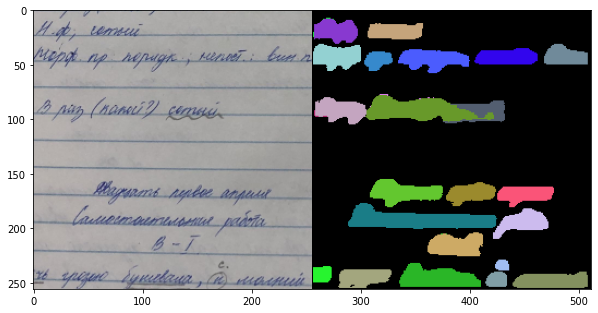

Epoch: [1]  [  0/105]  eta: 1:03:03  lr: 0.000300  loss: 1.3624 (1.3624)  loss_classifier: 0.2415 (0.2415)  loss_box_reg: 0.4633 (0.4633)  loss_mask: 0.3469 (0.3469)  loss_objectness: 0.1092 (0.1092)  loss_rpn_box_reg: 0.2014 (0.2014)  time: 36.0376  data: 33.5374  max mem: 8032
Epoch: [1]  [104/105]  eta: 0:00:04  lr: 0.000300  loss: 1.1609 (1.2534)  loss_classifier: 0.2217 (0.2390)  loss_box_reg: 0.3851 (0.4136)  loss_mask: 0.2921 (0.2968)  loss_objectness: 0.0850 (0.1054)  loss_rpn_box_reg: 0.2075 (0.1986)  time: 3.2715  data: 1.1006  max mem: 8032
Epoch: [1] Total time: 0:08:21 (4.7720 s / it)
updating best model, now it 0.15704477822012436


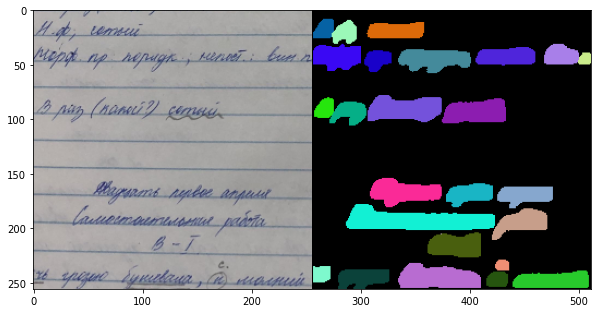

Epoch: [2]  [  0/105]  eta: 1:11:17  lr: 0.000300  loss: 1.1481 (1.1481)  loss_classifier: 0.2232 (0.2232)  loss_box_reg: 0.3702 (0.3702)  loss_mask: 0.2688 (0.2688)  loss_objectness: 0.0768 (0.0768)  loss_rpn_box_reg: 0.2092 (0.2092)  time: 40.7398  data: 38.1985  max mem: 8032
Epoch: [2]  [104/105]  eta: 0:00:04  lr: 0.000300  loss: 1.2069 (1.1811)  loss_classifier: 0.2222 (0.2259)  loss_box_reg: 0.3743 (0.3850)  loss_mask: 0.2723 (0.2849)  loss_objectness: 0.0866 (0.0976)  loss_rpn_box_reg: 0.1763 (0.1878)  time: 2.7699  data: 0.4809  max mem: 8032
Epoch: [2] Total time: 0:08:11 (4.6768 s / it)
updating best model, now it 0.1479917618852811


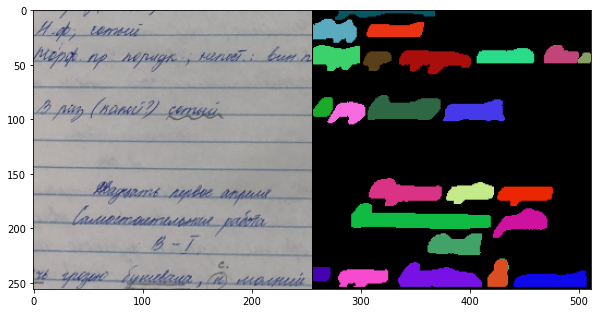

Epoch: [3]  [  0/105]  eta: 1:27:08  lr: 0.000300  loss: 1.2126 (1.2126)  loss_classifier: 0.2386 (0.2386)  loss_box_reg: 0.4033 (0.4033)  loss_mask: 0.3118 (0.3118)  loss_objectness: 0.0756 (0.0756)  loss_rpn_box_reg: 0.1832 (0.1832)  time: 49.7945  data: 47.1572  max mem: 8032
Epoch: [3]  [104/105]  eta: 0:00:04  lr: 0.000300  loss: 1.0849 (1.1332)  loss_classifier: 0.2117 (0.2161)  loss_box_reg: 0.3604 (0.3660)  loss_mask: 0.2705 (0.2790)  loss_objectness: 0.0712 (0.0913)  loss_rpn_box_reg: 0.1531 (0.1807)  time: 3.1088  data: 0.8708  max mem: 8032
Epoch: [3] Total time: 0:08:12 (4.6948 s / it)
updating best model, now it 0.1419859301645602


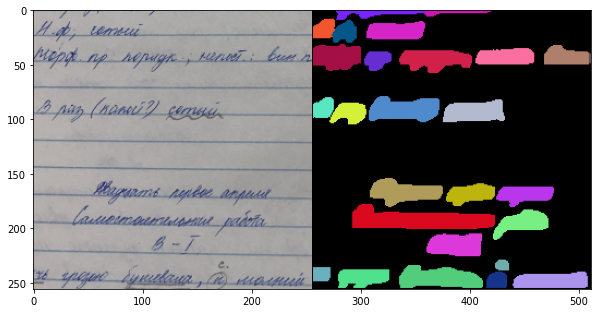

Epoch: [4]  [  0/105]  eta: 1:02:43  lr: 0.000300  loss: 1.2372 (1.2372)  loss_classifier: 0.2264 (0.2264)  loss_box_reg: 0.3814 (0.3814)  loss_mask: 0.3554 (0.3554)  loss_objectness: 0.1251 (0.1251)  loss_rpn_box_reg: 0.1488 (0.1488)  time: 35.8418  data: 33.2996  max mem: 8032
Epoch: [4]  [104/105]  eta: 0:00:04  lr: 0.000300  loss: 1.0886 (1.1210)  loss_classifier: 0.2093 (0.2151)  loss_box_reg: 0.3704 (0.3599)  loss_mask: 0.2654 (0.2733)  loss_objectness: 0.0887 (0.0846)  loss_rpn_box_reg: 0.1608 (0.1881)  time: 3.2752  data: 0.9023  max mem: 8032
Epoch: [4] Total time: 0:08:24 (4.8037 s / it)
updating best model, now it 0.14046292430176655


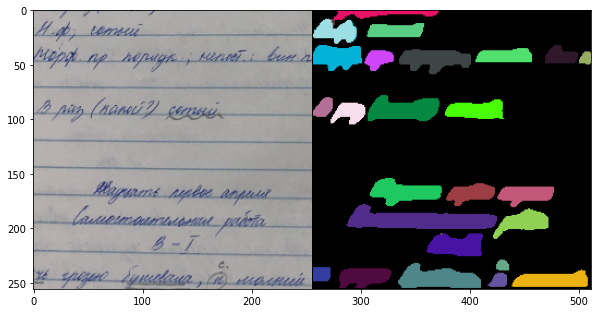

Epoch: [5]  [  0/105]  eta: 1:14:19  lr: 0.000300  loss: 1.0378 (1.0378)  loss_classifier: 0.2036 (0.2036)  loss_box_reg: 0.3564 (0.3564)  loss_mask: 0.2714 (0.2714)  loss_objectness: 0.0701 (0.0701)  loss_rpn_box_reg: 0.1363 (0.1363)  time: 42.4729  data: 39.8748  max mem: 8032
Epoch: [5]  [104/105]  eta: 0:00:04  lr: 0.000300  loss: 1.0334 (1.1063)  loss_classifier: 0.2081 (0.2095)  loss_box_reg: 0.3512 (0.3545)  loss_mask: 0.2630 (0.2724)  loss_objectness: 0.0678 (0.0851)  loss_rpn_box_reg: 0.1579 (0.1848)  time: 3.3884  data: 1.1812  max mem: 8032
Epoch: [5] Total time: 0:08:23 (4.7962 s / it)
updating best model, now it 0.13861469465679085


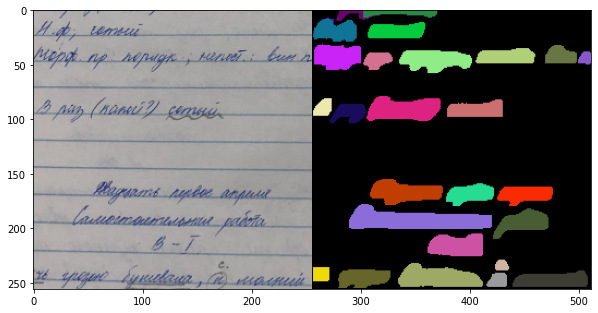

Epoch: [6]  [  0/105]  eta: 1:26:57  lr: 0.000300  loss: 1.0733 (1.0733)  loss_classifier: 0.2263 (0.2263)  loss_box_reg: 0.3749 (0.3749)  loss_mask: 0.2658 (0.2658)  loss_objectness: 0.0641 (0.0641)  loss_rpn_box_reg: 0.1422 (0.1422)  time: 49.6925  data: 47.1652  max mem: 8032
Epoch: [6]  [104/105]  eta: 0:00:04  lr: 0.000300  loss: 1.0732 (1.0912)  loss_classifier: 0.2073 (0.2075)  loss_box_reg: 0.3494 (0.3536)  loss_mask: 0.2649 (0.2711)  loss_objectness: 0.0687 (0.0827)  loss_rpn_box_reg: 0.1798 (0.1763)  time: 3.1352  data: 0.8929  max mem: 8032
Epoch: [6] Total time: 0:08:16 (4.7272 s / it)
updating best model, now it 0.13672002125753707


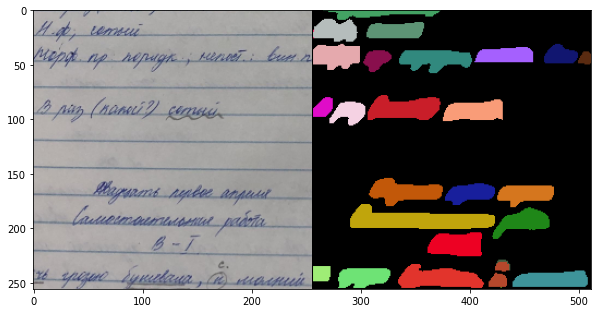

Epoch: [7]  [  0/105]  eta: 1:14:17  lr: 0.000300  loss: 0.9802 (0.9802)  loss_classifier: 0.1636 (0.1636)  loss_box_reg: 0.2948 (0.2948)  loss_mask: 0.2371 (0.2371)  loss_objectness: 0.1188 (0.1188)  loss_rpn_box_reg: 0.1658 (0.1658)  time: 42.4534  data: 39.8438  max mem: 8032
Epoch: [7]  [104/105]  eta: 0:00:04  lr: 0.000300  loss: 1.0372 (1.0730)  loss_classifier: 0.1874 (0.2001)  loss_box_reg: 0.3214 (0.3367)  loss_mask: 0.2579 (0.2671)  loss_objectness: 0.0789 (0.0895)  loss_rpn_box_reg: 0.1835 (0.1795)  time: 3.0685  data: 0.8459  max mem: 8032
Epoch: [7] Total time: 0:08:15 (4.7166 s / it)
updating best model, now it 0.13444237115844052


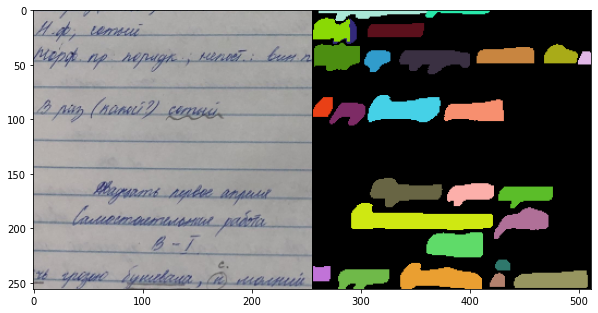

Epoch: [8]  [  0/105]  eta: 1:14:12  lr: 0.000300  loss: 1.1010 (1.1010)  loss_classifier: 0.2321 (0.2321)  loss_box_reg: 0.3603 (0.3603)  loss_mask: 0.2780 (0.2780)  loss_objectness: 0.0601 (0.0601)  loss_rpn_box_reg: 0.1706 (0.1706)  time: 42.4022  data: 39.8671  max mem: 8032
Epoch: [8]  [104/105]  eta: 0:00:04  lr: 0.000300  loss: 1.0149 (1.0562)  loss_classifier: 0.1871 (0.1973)  loss_box_reg: 0.3380 (0.3360)  loss_mask: 0.2634 (0.2671)  loss_objectness: 0.0693 (0.0783)  loss_rpn_box_reg: 0.1396 (0.1775)  time: 3.1380  data: 0.8883  max mem: 8032
Epoch: [8] Total time: 0:08:05 (4.6283 s / it)
updating best model, now it 0.13233673458736667


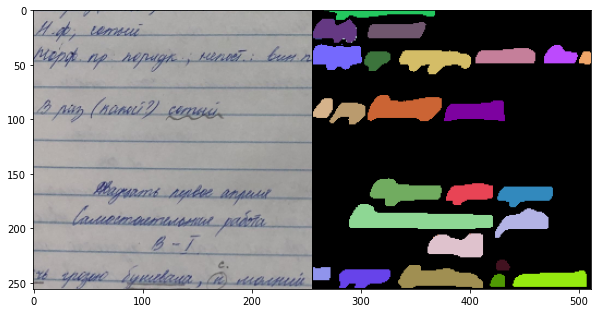

Epoch: [9]  [  0/105]  eta: 1:09:29  lr: 0.000300  loss: 1.1672 (1.1672)  loss_classifier: 0.1668 (0.1668)  loss_box_reg: 0.3390 (0.3390)  loss_mask: 0.2714 (0.2714)  loss_objectness: 0.1049 (0.1049)  loss_rpn_box_reg: 0.2851 (0.2851)  time: 39.7084  data: 37.1491  max mem: 8032
Epoch: [9]  [104/105]  eta: 0:00:04  lr: 0.000300  loss: 1.0040 (1.0785)  loss_classifier: 0.1860 (0.2034)  loss_box_reg: 0.3187 (0.3405)  loss_mask: 0.2622 (0.2690)  loss_objectness: 0.0686 (0.0854)  loss_rpn_box_reg: 0.1467 (0.1802)  time: 3.2327  data: 0.9844  max mem: 8032
Epoch: [9] Total time: 0:08:13 (4.7028 s / it)


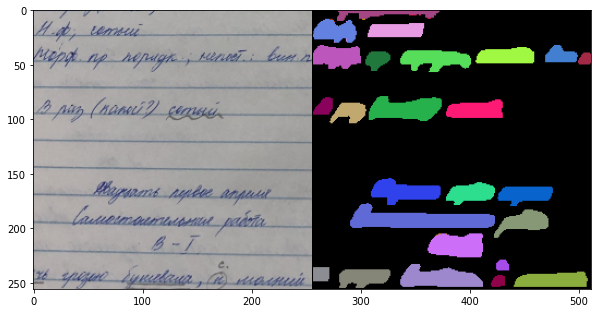

Epoch: [10]  [  0/105]  eta: 1:08:56  lr: 0.000300  loss: 1.0157 (1.0157)  loss_classifier: 0.1974 (0.1974)  loss_box_reg: 0.3588 (0.3588)  loss_mask: 0.2778 (0.2778)  loss_objectness: 0.0560 (0.0560)  loss_rpn_box_reg: 0.1258 (0.1258)  time: 39.3983  data: 36.8690  max mem: 8032
Epoch: [10]  [104/105]  eta: 0:00:04  lr: 0.000300  loss: 1.0530 (1.0576)  loss_classifier: 0.2026 (0.1992)  loss_box_reg: 0.3300 (0.3360)  loss_mask: 0.2679 (0.2686)  loss_objectness: 0.0615 (0.0798)  loss_rpn_box_reg: 0.1458 (0.1740)  time: 3.4062  data: 1.1147  max mem: 8032
Epoch: [10] Total time: 0:07:56 (4.5372 s / it)
creating index...
index created!
Test:  [ 0/12]  eta: 0:07:29  model_time: 1.6435 (1.6435)  evaluator_time: 3.1057 (3.1057)  time: 37.4655  data: 32.6730  max mem: 8032
Test:  [11/12]  eta: 0:00:05  model_time: 0.9806 (1.2275)  evaluator_time: 0.7324 (1.5227)  time: 5.5773  data: 2.8064  max mem: 8032
Test: Total time: 0:01:07 (5.6089 s / it)
Averaged stats: model_time: 0.9806 (1.2275)  ev

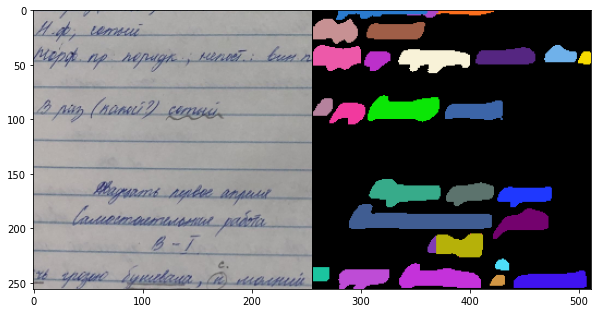

Epoch: [11]  [  0/105]  eta: 1:01:53  lr: 0.000300  loss: 0.9429 (0.9429)  loss_classifier: 0.1656 (0.1656)  loss_box_reg: 0.2949 (0.2949)  loss_mask: 0.2770 (0.2770)  loss_objectness: 0.0622 (0.0622)  loss_rpn_box_reg: 0.1433 (0.1433)  time: 35.3627  data: 32.8916  max mem: 8032
Epoch: [11]  [104/105]  eta: 0:00:04  lr: 0.000300  loss: 1.0351 (1.0294)  loss_classifier: 0.1962 (0.1949)  loss_box_reg: 0.3308 (0.3259)  loss_mask: 0.2653 (0.2674)  loss_objectness: 0.0856 (0.0812)  loss_rpn_box_reg: 0.1473 (0.1600)  time: 3.4750  data: 1.1821  max mem: 8032
Epoch: [11] Total time: 0:08:14 (4.7113 s / it)
updating best model, now it 0.12898068425194462


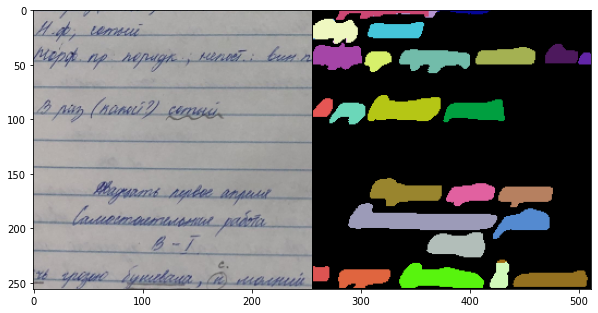

Epoch: [12]  [  0/105]  eta: 1:10:54  lr: 0.000300  loss: 1.2204 (1.2204)  loss_classifier: 0.1988 (0.1988)  loss_box_reg: 0.3614 (0.3614)  loss_mask: 0.2680 (0.2680)  loss_objectness: 0.0756 (0.0756)  loss_rpn_box_reg: 0.3166 (0.3166)  time: 40.5217  data: 37.9532  max mem: 8032
Epoch: [12]  [104/105]  eta: 0:00:04  lr: 0.000300  loss: 0.9946 (1.0479)  loss_classifier: 0.1992 (0.1975)  loss_box_reg: 0.3204 (0.3318)  loss_mask: 0.2609 (0.2647)  loss_objectness: 0.0719 (0.0759)  loss_rpn_box_reg: 0.1471 (0.1780)  time: 3.7290  data: 1.4587  max mem: 8032
Epoch: [12] Total time: 0:08:17 (4.7371 s / it)


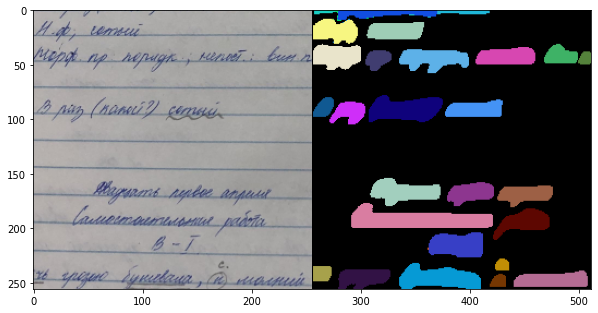

Epoch: [13]  [  0/105]  eta: 1:27:30  lr: 0.000300  loss: 1.0774 (1.0774)  loss_classifier: 0.2190 (0.2190)  loss_box_reg: 0.3732 (0.3732)  loss_mask: 0.2645 (0.2645)  loss_objectness: 0.0631 (0.0631)  loss_rpn_box_reg: 0.1575 (0.1575)  time: 50.0056  data: 47.5116  max mem: 8032
Epoch: [13]  [104/105]  eta: 0:00:04  lr: 0.000300  loss: 1.0404 (1.0456)  loss_classifier: 0.2038 (0.1969)  loss_box_reg: 0.3396 (0.3327)  loss_mask: 0.2590 (0.2670)  loss_objectness: 0.0700 (0.0780)  loss_rpn_box_reg: 0.1553 (0.1710)  time: 3.2399  data: 0.9787  max mem: 8032
Epoch: [13] Total time: 0:08:08 (4.6503 s / it)


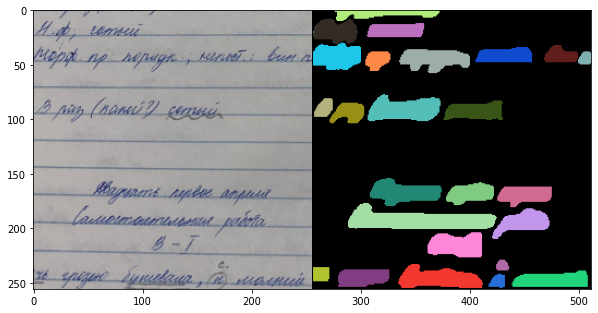

Epoch: [14]  [  0/105]  eta: 1:04:54  lr: 0.000300  loss: 0.9952 (0.9952)  loss_classifier: 0.2189 (0.2189)  loss_box_reg: 0.3476 (0.3476)  loss_mask: 0.2668 (0.2668)  loss_objectness: 0.0674 (0.0674)  loss_rpn_box_reg: 0.0945 (0.0945)  time: 37.0864  data: 34.5481  max mem: 8032
Epoch: [14]  [104/105]  eta: 0:00:04  lr: 0.000300  loss: 1.0292 (1.0379)  loss_classifier: 0.1789 (0.1929)  loss_box_reg: 0.3017 (0.3260)  loss_mask: 0.2596 (0.2623)  loss_objectness: 0.0775 (0.0785)  loss_rpn_box_reg: 0.1767 (0.1782)  time: 3.2502  data: 1.0157  max mem: 8032
Epoch: [14] Total time: 0:08:20 (4.7653 s / it)


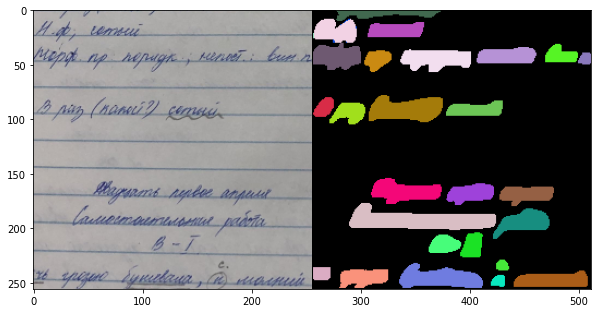

Epoch: [15]  [  0/105]  eta: 1:21:16  lr: 0.000030  loss: 0.8635 (0.8635)  loss_classifier: 0.1493 (0.1493)  loss_box_reg: 0.2673 (0.2673)  loss_mask: 0.2572 (0.2572)  loss_objectness: 0.0529 (0.0529)  loss_rpn_box_reg: 0.1368 (0.1368)  time: 46.4408  data: 43.9760  max mem: 8032
Epoch: [15]  [104/105]  eta: 0:00:04  lr: 0.000030  loss: 0.9525 (0.9664)  loss_classifier: 0.1718 (0.1792)  loss_box_reg: 0.2980 (0.3031)  loss_mask: 0.2473 (0.2528)  loss_objectness: 0.0548 (0.0708)  loss_rpn_box_reg: 0.1472 (0.1604)  time: 3.2435  data: 0.9826  max mem: 8032
Epoch: [15] Total time: 0:08:19 (4.7575 s / it)
updating best model, now it 0.12108868773057524


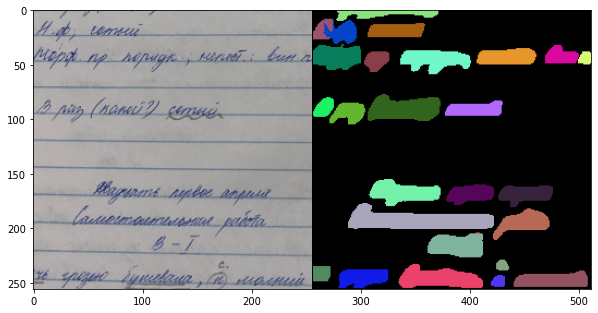

Epoch: [16]  [  0/105]  eta: 1:10:17  lr: 0.000030  loss: 0.8520 (0.8520)  loss_classifier: 0.1513 (0.1513)  loss_box_reg: 0.2990 (0.2990)  loss_mask: 0.2727 (0.2727)  loss_objectness: 0.0404 (0.0404)  loss_rpn_box_reg: 0.0886 (0.0886)  time: 40.1697  data: 37.6304  max mem: 8032
Epoch: [16]  [104/105]  eta: 0:00:04  lr: 0.000030  loss: 0.9547 (0.9288)  loss_classifier: 0.1758 (0.1745)  loss_box_reg: 0.3005 (0.2965)  loss_mask: 0.2544 (0.2521)  loss_objectness: 0.0552 (0.0601)  loss_rpn_box_reg: 0.1649 (0.1456)  time: 3.0861  data: 0.8382  max mem: 8032
Epoch: [16] Total time: 0:08:15 (4.7151 s / it)
updating best model, now it 0.11638092219402796


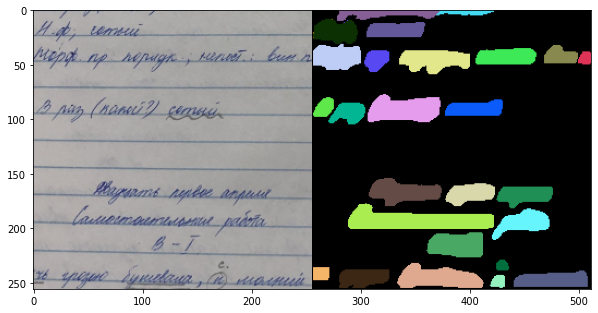

Epoch: [17]  [  0/105]  eta: 1:12:43  lr: 0.000030  loss: 0.9447 (0.9447)  loss_classifier: 0.1554 (0.1554)  loss_box_reg: 0.2563 (0.2563)  loss_mask: 0.2310 (0.2310)  loss_objectness: 0.0799 (0.0799)  loss_rpn_box_reg: 0.2221 (0.2221)  time: 41.5527  data: 38.9784  max mem: 8032
Epoch: [17]  [104/105]  eta: 0:00:04  lr: 0.000030  loss: 0.9167 (0.9306)  loss_classifier: 0.1631 (0.1746)  loss_box_reg: 0.2802 (0.2921)  loss_mask: 0.2371 (0.2491)  loss_objectness: 0.0540 (0.0625)  loss_rpn_box_reg: 0.1571 (0.1524)  time: 3.2671  data: 0.9911  max mem: 8032
Epoch: [17] Total time: 0:08:14 (4.7066 s / it)


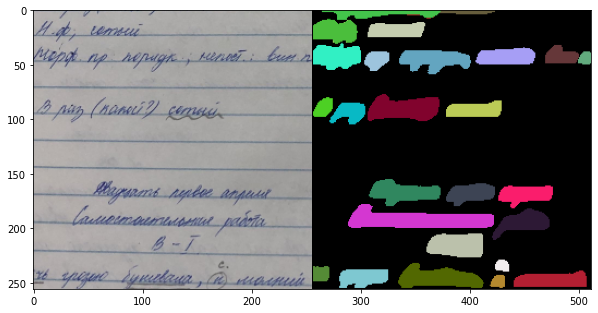

Epoch: [18]  [  0/105]  eta: 1:11:22  lr: 0.000030  loss: 0.9604 (0.9604)  loss_classifier: 0.1601 (0.1601)  loss_box_reg: 0.2839 (0.2839)  loss_mask: 0.2647 (0.2647)  loss_objectness: 0.0571 (0.0571)  loss_rpn_box_reg: 0.1946 (0.1946)  time: 40.7836  data: 38.2903  max mem: 8032
Epoch: [18]  [104/105]  eta: 0:00:04  lr: 0.000030  loss: 0.8564 (0.9299)  loss_classifier: 0.1670 (0.1755)  loss_box_reg: 0.2786 (0.2945)  loss_mask: 0.2421 (0.2515)  loss_objectness: 0.0553 (0.0615)  loss_rpn_box_reg: 0.1448 (0.1469)  time: 3.7523  data: 1.4702  max mem: 8032
Epoch: [18] Total time: 0:08:14 (4.7131 s / it)


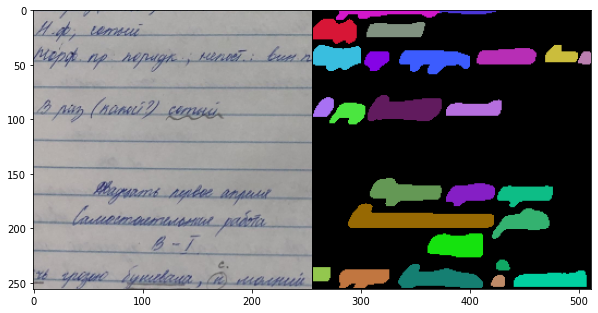

Epoch: [19]  [  0/105]  eta: 1:12:23  lr: 0.000030  loss: 0.8445 (0.8445)  loss_classifier: 0.1610 (0.1610)  loss_box_reg: 0.2789 (0.2789)  loss_mask: 0.2505 (0.2505)  loss_objectness: 0.0347 (0.0347)  loss_rpn_box_reg: 0.1194 (0.1194)  time: 41.3685  data: 38.8212  max mem: 8032
Epoch: [19]  [104/105]  eta: 0:00:04  lr: 0.000030  loss: 0.9082 (0.9102)  loss_classifier: 0.1748 (0.1718)  loss_box_reg: 0.2900 (0.2882)  loss_mask: 0.2516 (0.2481)  loss_objectness: 0.0468 (0.0569)  loss_rpn_box_reg: 0.1268 (0.1451)  time: 3.2240  data: 1.0011  max mem: 8032
Epoch: [19] Total time: 0:08:07 (4.6403 s / it)
updating best model, now it 0.11404155795784725


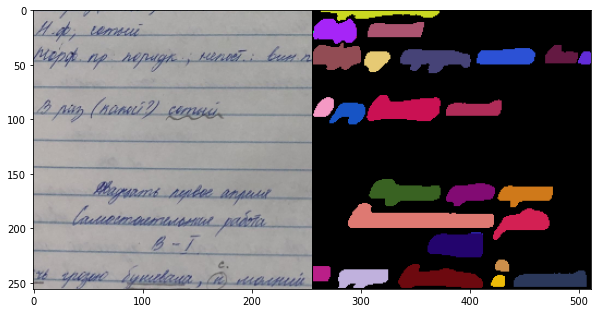

Epoch: [20]  [  0/105]  eta: 1:12:27  lr: 0.000030  loss: 0.9780 (0.9780)  loss_classifier: 0.1817 (0.1817)  loss_box_reg: 0.3087 (0.3087)  loss_mask: 0.2697 (0.2697)  loss_objectness: 0.0706 (0.0706)  loss_rpn_box_reg: 0.1472 (0.1472)  time: 41.4008  data: 38.9628  max mem: 8032
Epoch: [20]  [104/105]  eta: 0:00:04  lr: 0.000030  loss: 0.9080 (0.9198)  loss_classifier: 0.1693 (0.1694)  loss_box_reg: 0.2883 (0.2886)  loss_mask: 0.2554 (0.2467)  loss_objectness: 0.0587 (0.0606)  loss_rpn_box_reg: 0.1226 (0.1545)  time: 3.7150  data: 1.4839  max mem: 8032
Epoch: [20] Total time: 0:08:11 (4.6819 s / it)
creating index...
index created!
Test:  [ 0/12]  eta: 0:07:29  model_time: 2.1395 (2.1395)  evaluator_time: 3.1194 (3.1194)  time: 37.4649  data: 32.1640  max mem: 8032
Test:  [11/12]  eta: 0:00:05  model_time: 0.8847 (1.1400)  evaluator_time: 0.5485 (1.3891)  time: 5.3038  data: 2.7558  max mem: 8032
Test: Total time: 0:01:04 (5.3370 s / it)
Averaged stats: model_time: 0.8847 (1.1400)  ev

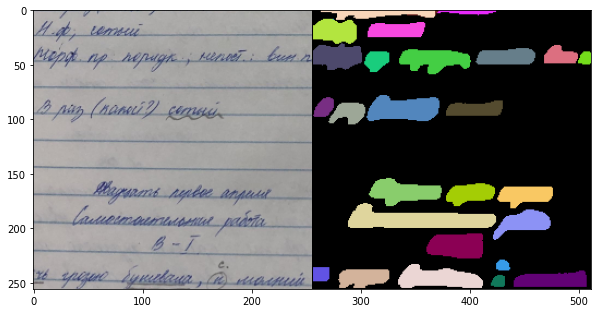

Epoch: [21]  [  0/105]  eta: 1:18:35  lr: 0.000030  loss: 1.3827 (1.3827)  loss_classifier: 0.2147 (0.2147)  loss_box_reg: 0.3441 (0.3441)  loss_mask: 0.2955 (0.2955)  loss_objectness: 0.1245 (0.1245)  loss_rpn_box_reg: 0.4041 (0.4041)  time: 44.9117  data: 42.3643  max mem: 8032
Epoch: [21]  [104/105]  eta: 0:00:04  lr: 0.000030  loss: 0.8963 (0.9248)  loss_classifier: 0.1673 (0.1677)  loss_box_reg: 0.2882 (0.2878)  loss_mask: 0.2524 (0.2482)  loss_objectness: 0.0632 (0.0620)  loss_rpn_box_reg: 0.1388 (0.1592)  time: 3.3799  data: 1.1511  max mem: 8032
Epoch: [21] Total time: 0:08:25 (4.8163 s / it)


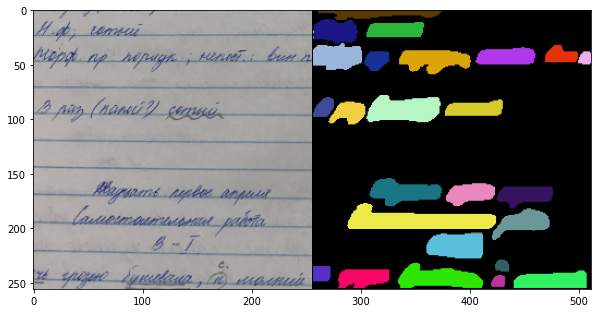

Epoch: [22]  [  0/105]  eta: 1:30:25  lr: 0.000030  loss: 0.8986 (0.8986)  loss_classifier: 0.1682 (0.1682)  loss_box_reg: 0.2676 (0.2676)  loss_mask: 0.2441 (0.2441)  loss_objectness: 0.0375 (0.0375)  loss_rpn_box_reg: 0.1812 (0.1812)  time: 51.6691  data: 49.0617  max mem: 8032
Epoch: [22]  [104/105]  eta: 0:00:04  lr: 0.000030  loss: 0.8733 (0.9146)  loss_classifier: 0.1635 (0.1707)  loss_box_reg: 0.2783 (0.2878)  loss_mask: 0.2437 (0.2477)  loss_objectness: 0.0442 (0.0572)  loss_rpn_box_reg: 0.1277 (0.1513)  time: 3.3866  data: 1.1575  max mem: 8032
Epoch: [22] Total time: 0:08:18 (4.7483 s / it)


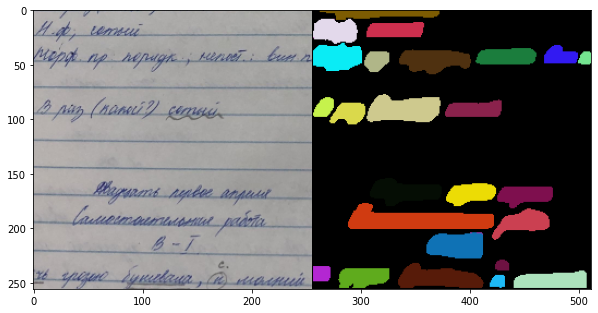

Epoch: [23]  [  0/105]  eta: 1:19:07  lr: 0.000030  loss: 0.9680 (0.9680)  loss_classifier: 0.1912 (0.1912)  loss_box_reg: 0.3162 (0.3162)  loss_mask: 0.2533 (0.2533)  loss_objectness: 0.0528 (0.0528)  loss_rpn_box_reg: 0.1545 (0.1545)  time: 45.2169  data: 42.6456  max mem: 8032
Epoch: [23]  [104/105]  eta: 0:00:04  lr: 0.000030  loss: 0.8609 (0.8976)  loss_classifier: 0.1580 (0.1674)  loss_box_reg: 0.2736 (0.2841)  loss_mask: 0.2378 (0.2454)  loss_objectness: 0.0406 (0.0543)  loss_rpn_box_reg: 0.1345 (0.1464)  time: 3.1990  data: 0.9492  max mem: 8032
Epoch: [23] Total time: 0:08:19 (4.7559 s / it)
updating best model, now it 0.11246319851329048


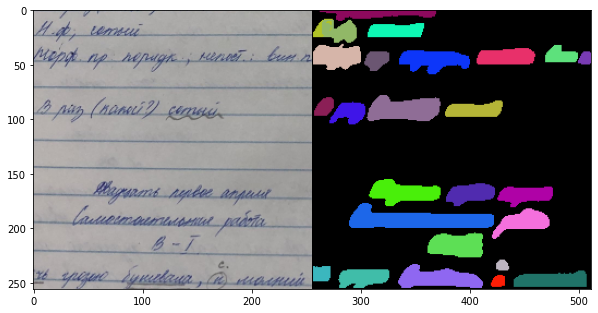

Epoch: [24]  [  0/105]  eta: 1:41:56  lr: 0.000030  loss: 0.9551 (0.9551)  loss_classifier: 0.2106 (0.2106)  loss_box_reg: 0.3250 (0.3250)  loss_mask: 0.2617 (0.2617)  loss_objectness: 0.0569 (0.0569)  loss_rpn_box_reg: 0.1009 (0.1009)  time: 58.2542  data: 55.7350  max mem: 8032
Epoch: [24]  [104/105]  eta: 0:00:04  lr: 0.000030  loss: 0.8755 (0.9106)  loss_classifier: 0.1684 (0.1707)  loss_box_reg: 0.2887 (0.2898)  loss_mask: 0.2443 (0.2477)  loss_objectness: 0.0512 (0.0579)  loss_rpn_box_reg: 0.1214 (0.1444)  time: 3.3049  data: 1.0958  max mem: 8032
Epoch: [24] Total time: 0:08:24 (4.8086 s / it)


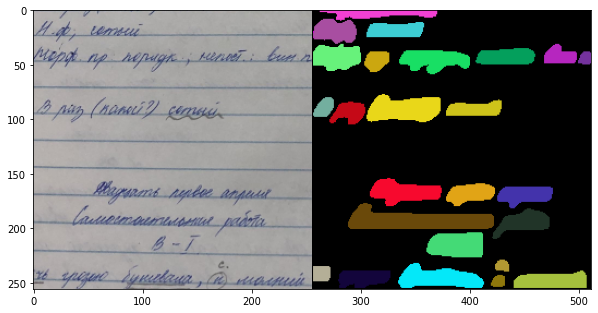

Epoch: [25]  [  0/105]  eta: 1:22:03  lr: 0.000030  loss: 1.0491 (1.0491)  loss_classifier: 0.2035 (0.2035)  loss_box_reg: 0.3241 (0.3241)  loss_mask: 0.2556 (0.2556)  loss_objectness: 0.0794 (0.0794)  loss_rpn_box_reg: 0.1864 (0.1864)  time: 46.8882  data: 44.3226  max mem: 8032
Epoch: [25]  [104/105]  eta: 0:00:04  lr: 0.000030  loss: 0.9001 (0.9030)  loss_classifier: 0.1717 (0.1680)  loss_box_reg: 0.2828 (0.2876)  loss_mask: 0.2449 (0.2463)  loss_objectness: 0.0444 (0.0559)  loss_rpn_box_reg: 0.1177 (0.1451)  time: 3.2062  data: 0.9885  max mem: 8032
Epoch: [25] Total time: 0:08:17 (4.7372 s / it)


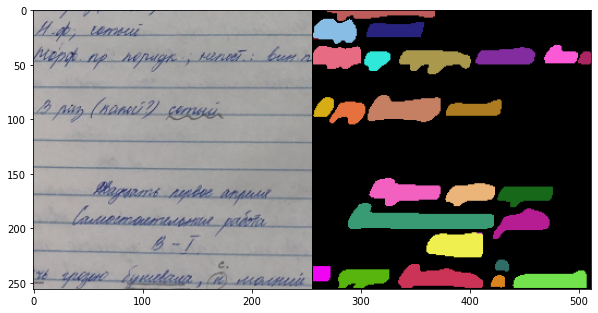

Epoch: [26]  [  0/105]  eta: 1:10:56  lr: 0.000030  loss: 0.9181 (0.9181)  loss_classifier: 0.1763 (0.1763)  loss_box_reg: 0.2787 (0.2787)  loss_mask: 0.2470 (0.2470)  loss_objectness: 0.0455 (0.0455)  loss_rpn_box_reg: 0.1705 (0.1705)  time: 40.5413  data: 37.9996  max mem: 8032
Epoch: [26]  [104/105]  eta: 0:00:04  lr: 0.000030  loss: 0.8571 (0.8931)  loss_classifier: 0.1606 (0.1679)  loss_box_reg: 0.2712 (0.2829)  loss_mask: 0.2391 (0.2463)  loss_objectness: 0.0577 (0.0563)  loss_rpn_box_reg: 0.1296 (0.1396)  time: 3.1135  data: 0.8617  max mem: 8032
Epoch: [26] Total time: 0:08:23 (4.7972 s / it)
updating best model, now it 0.11189791161860373


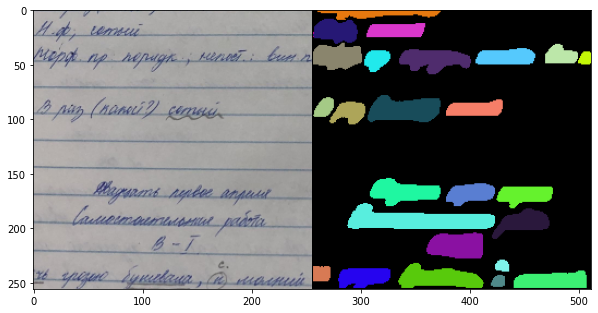

Epoch: [27]  [  0/105]  eta: 1:13:54  lr: 0.000030  loss: 0.8546 (0.8546)  loss_classifier: 0.1468 (0.1468)  loss_box_reg: 0.2802 (0.2802)  loss_mask: 0.2482 (0.2482)  loss_objectness: 0.0449 (0.0449)  loss_rpn_box_reg: 0.1345 (0.1345)  time: 42.2326  data: 39.7180  max mem: 8032
Epoch: [27]  [104/105]  eta: 0:00:04  lr: 0.000030  loss: 0.9108 (0.9062)  loss_classifier: 0.1612 (0.1687)  loss_box_reg: 0.2830 (0.2856)  loss_mask: 0.2398 (0.2476)  loss_objectness: 0.0628 (0.0594)  loss_rpn_box_reg: 0.1543 (0.1450)  time: 2.9652  data: 0.7653  max mem: 8032
Epoch: [27] Total time: 0:08:11 (4.6798 s / it)


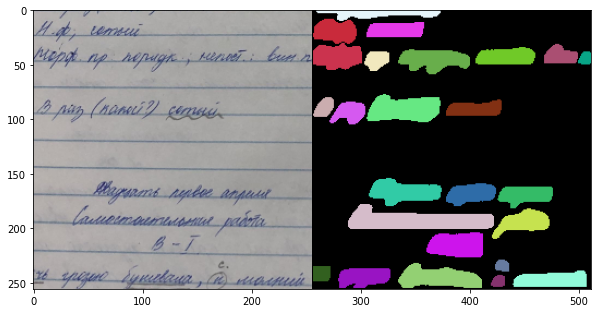

Epoch: [28]  [  0/105]  eta: 1:06:48  lr: 0.000030  loss: 0.8755 (0.8755)  loss_classifier: 0.1605 (0.1605)  loss_box_reg: 0.2832 (0.2832)  loss_mask: 0.2537 (0.2537)  loss_objectness: 0.0382 (0.0382)  loss_rpn_box_reg: 0.1399 (0.1399)  time: 38.1772  data: 35.6495  max mem: 8032
Epoch: [28]  [104/105]  eta: 0:00:04  lr: 0.000030  loss: 0.8881 (0.8957)  loss_classifier: 0.1706 (0.1681)  loss_box_reg: 0.2891 (0.2862)  loss_mask: 0.2388 (0.2468)  loss_objectness: 0.0495 (0.0528)  loss_rpn_box_reg: 0.1262 (0.1419)  time: 3.3958  data: 1.1386  max mem: 8032
Epoch: [28] Total time: 0:08:12 (4.6901 s / it)


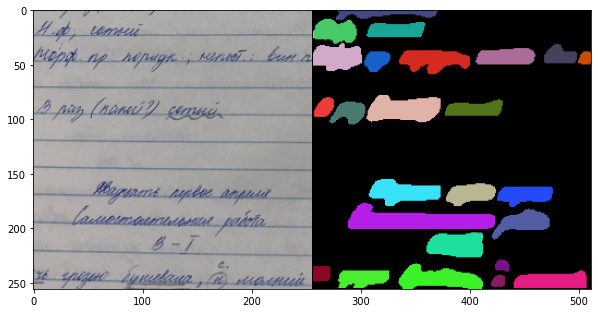

Epoch: [29]  [  0/105]  eta: 1:27:54  lr: 0.000030  loss: 0.8178 (0.8178)  loss_classifier: 0.1578 (0.1578)  loss_box_reg: 0.2779 (0.2779)  loss_mask: 0.2220 (0.2220)  loss_objectness: 0.0470 (0.0470)  loss_rpn_box_reg: 0.1130 (0.1130)  time: 50.2304  data: 47.5896  max mem: 8032
Epoch: [29]  [104/105]  eta: 0:00:04  lr: 0.000030  loss: 0.8602 (0.8848)  loss_classifier: 0.1652 (0.1626)  loss_box_reg: 0.2753 (0.2759)  loss_mask: 0.2440 (0.2435)  loss_objectness: 0.0514 (0.0560)  loss_rpn_box_reg: 0.1376 (0.1468)  time: 3.2085  data: 1.0109  max mem: 8032
Epoch: [29] Total time: 0:08:14 (4.7095 s / it)
updating best model, now it 0.1108580366808361


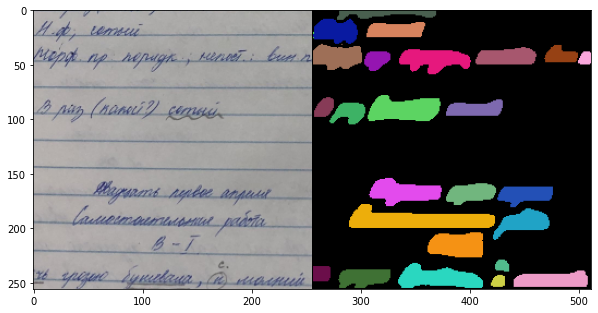

Epoch: [30]  [  0/105]  eta: 0:58:27  lr: 0.000003  loss: 1.2091 (1.2091)  loss_classifier: 0.1619 (0.1619)  loss_box_reg: 0.2342 (0.2342)  loss_mask: 0.2538 (0.2538)  loss_objectness: 0.0870 (0.0870)  loss_rpn_box_reg: 0.4721 (0.4721)  time: 33.4015  data: 30.9775  max mem: 8032
Epoch: [30]  [104/105]  eta: 0:00:04  lr: 0.000003  loss: 0.8909 (0.8976)  loss_classifier: 0.1630 (0.1665)  loss_box_reg: 0.2766 (0.2810)  loss_mask: 0.2471 (0.2431)  loss_objectness: 0.0487 (0.0590)  loss_rpn_box_reg: 0.1395 (0.1480)  time: 2.8901  data: 0.6945  max mem: 8032
Epoch: [30] Total time: 0:08:23 (4.7980 s / it)
creating index...
index created!
Test:  [ 0/12]  eta: 0:08:03  model_time: 1.6494 (1.6494)  evaluator_time: 2.8331 (2.8331)  time: 40.3236  data: 35.8170  max mem: 8032
Test:  [11/12]  eta: 0:00:05  model_time: 0.9251 (1.0952)  evaluator_time: 0.6359 (1.2573)  time: 5.3999  data: 3.0301  max mem: 8032
Test: Total time: 0:01:05 (5.4358 s / it)
Averaged stats: model_time: 0.9251 (1.0952)  ev

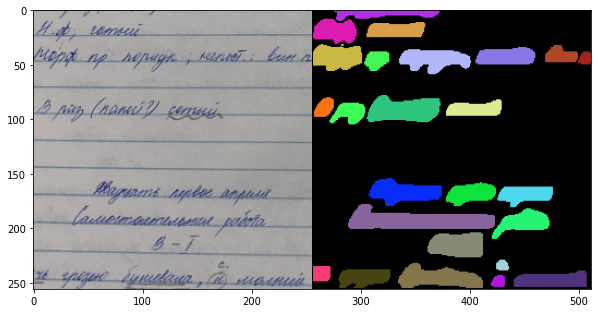

Epoch: [31]  [  0/105]  eta: 1:19:14  lr: 0.000003  loss: 0.9937 (0.9937)  loss_classifier: 0.1874 (0.1874)  loss_box_reg: 0.3070 (0.3070)  loss_mask: 0.2418 (0.2418)  loss_objectness: 0.0650 (0.0650)  loss_rpn_box_reg: 0.1924 (0.1924)  time: 45.2775  data: 42.6854  max mem: 8032
Epoch: [31]  [104/105]  eta: 0:00:04  lr: 0.000003  loss: 0.8852 (0.8950)  loss_classifier: 0.1720 (0.1682)  loss_box_reg: 0.2730 (0.2800)  loss_mask: 0.2358 (0.2448)  loss_objectness: 0.0528 (0.0569)  loss_rpn_box_reg: 0.1124 (0.1451)  time: 3.4088  data: 1.0640  max mem: 8032
Epoch: [31] Total time: 0:08:19 (4.7607 s / it)


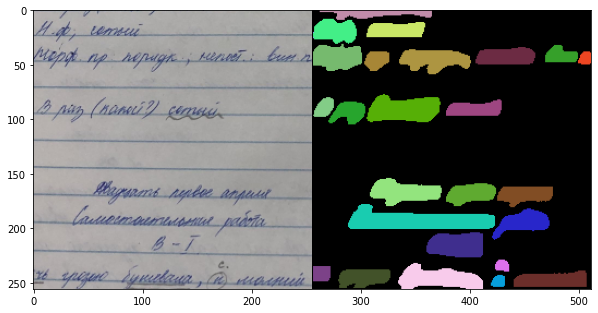

Epoch: [32]  [  0/105]  eta: 1:02:22  lr: 0.000003  loss: 0.8472 (0.8472)  loss_classifier: 0.1632 (0.1632)  loss_box_reg: 0.2453 (0.2453)  loss_mask: 0.2218 (0.2218)  loss_objectness: 0.0380 (0.0380)  loss_rpn_box_reg: 0.1789 (0.1789)  time: 35.6449  data: 33.0441  max mem: 8032
Epoch: [32]  [104/105]  eta: 0:00:04  lr: 0.000003  loss: 0.8635 (0.8819)  loss_classifier: 0.1609 (0.1653)  loss_box_reg: 0.2753 (0.2776)  loss_mask: 0.2365 (0.2421)  loss_objectness: 0.0539 (0.0556)  loss_rpn_box_reg: 0.1300 (0.1413)  time: 3.2972  data: 1.0394  max mem: 8032
Epoch: [32] Total time: 0:08:08 (4.6490 s / it)
updating best model, now it 0.11049636629430093


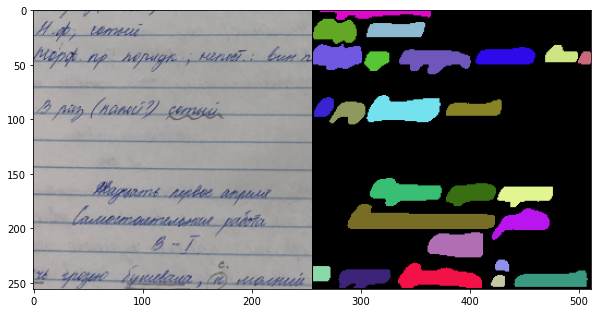

KeyboardInterrupt: ignored

In [ ]:
# let's train it for 10 epochs
num_epochs = 35
eval_freq = 10
best_loss = 1e9

for epoch in range(num_epochs):
    # train for one epoch, printing every 10 iterations
    now_loss = engine.train_one_epoch(model, optimizer, train_loader, device, epoch, print_freq=200)
    # update the learning rate
    lr_scheduler.step()
    # evaluate on the test dataset
    if epoch % eval_freq == 0:
      engine.evaluate(model, val_loader, device=device)

    if now_loss < best_loss:
      best_loss = now_loss
      print('updating best model, now it {}'.format(best_loss))
      torch.save(model, '/content/drive/MyDrive/НТИ ИИ /team/sergey_models/mask_rcnn_small_adam_en_best')

    torch.save(model, '/content/drive/MyDrive/НТИ ИИ /team/sergey_models/mask_rcnn_small_adam_en_last')
    show_random_predict(model, val_loader, batch)

# Train myself

## Train loops

In [ ]:
warmup_scheduler = None

In [ ]:
def train_epoch(model, batch_gen, criterion, optimizer, is_train = True) :
    loss_sum = collections.defaultdict(int)
    count = 0
    loss_names = ['loss_box_reg', 'loss_rpn_box_reg', 'loss_objectness', 'loss_classifier', 'loss_mask'] # 
    # model.train(is_train)

    for images, targets in tqdm(batch_gen):
        # print(input.shape, labels)
        images = list(image.to(device) for image in images)
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        with torch.set_grad_enabled(is_train):
            loss_dict = model(images, targets)
            losses = sum(loss_dict[k] for k in loss_names)

            for k in loss_names:
              loss_sum[k] += loss_dict[k].item()
    
            loss_sum['loss'] += losses.item()
                    
            if is_train :
                optimizer.zero_grad()
                losses.backward()
                optimizer.step()

            count += len(images)
        
        if warmup_scheduler is not None:
          warmup_scheduler.step()

    return {k: v / count for k,v in loss_sum.items()}

In [ ]:
def train_model(model, train_loader, test_loader, criterion, optimizer, scheduler, num_epochs, save_name, verbose=True):
    loader = {'train': train_loader, 'test': test_loader}
    loss_history = {'train': [], 'test': []}
    best_loss = 10

    # warmup_factor = 1. / 1000
    # warmup_iters = min(1000, len(train_loader) - 1)
    # warmup_scheduler = utils.warmup_lr_scheduler(optimizer, warmup_iters, warmup_factor)

    for epoch in range(num_epochs):
        if verbose:
            print('Epoch {}/{}'.format(epoch, num_epochs - 1))
            print('-' * 10)

        for phase in ['train', 'test']:
            epoch_loss = train_epoch(model, loader[phase], criterion, optimizer, phase == 'train')
            warmup_scheduler = None

            if verbose:
                print('{} Loss: {} '.format(phase, epoch_loss))
            loss_history[phase].append(epoch_loss)

        scheduler.step()
        
        if best_loss > loss_history['test'][-1]['loss']:
          best_loss = loss_history['test'][-1]['loss']
          torch.save(model, '/content/drive/MyDrive/НТИ ИИ /team/sergey_models/{}_best'.format(save_name))
          print('updated best loss, now it {}'.format(best_loss))
          
        torch.save(model, '/content/drive/MyDrive/НТИ ИИ /team/sergey_models/{}_last'.format(save_name))
        if verbose:
            show_random_predict(model, test_loader, batch)
            print()

    return loss_history

## Train mask-rcnn

In [ ]:
model = get_instance_segmentation_model()
model = model.to(device)


params = [p for p in model.parameters() if p.requires_grad]
optimizer = optim.Adam(params, lr=3e-4)

lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer,
                                               step_size=20,
                                               gamma=0.5)

Epoch 0/29
----------


100%|██████████| 98/98 [07:07<00:00,  4.36s/it]


train Loss: {'loss_box_reg': 0.055319822317845116, 'loss_rpn_box_reg': 0.02571481348349781, 'loss_objectness': 0.016485191162488637, 'loss_classifier': 0.03250909423122381, 'loss_mask': 0.03872861110028766, 'loss': 0.16875753301451105} 


100%|██████████| 11/11 [00:50<00:00,  4.56s/it]


test Loss: {'loss_box_reg': 0.05034880357227106, 'loss_rpn_box_reg': 0.022726718036607765, 'loss_objectness': 0.010843117860541946, 'loss_classifier': 0.027398518618495984, 'loss_mask': 0.035525876900245404, 'loss': 0.14684303601582846} 
updated best loss, now it 0.14684303601582846


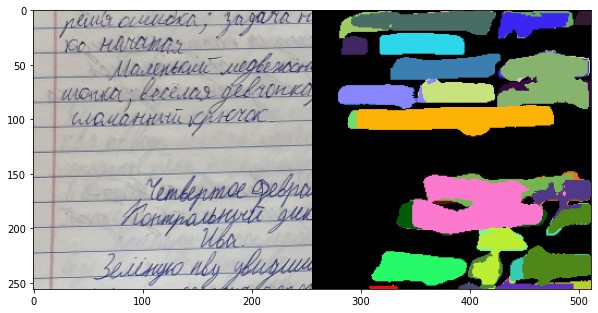


Epoch 1/29
----------


100%|██████████| 98/98 [07:09<00:00,  4.38s/it]


train Loss: {'loss_box_reg': 0.052665821872315964, 'loss_rpn_box_reg': 0.024145299182818818, 'loss_objectness': 0.014305449887975916, 'loss_classifier': 0.030986611293856547, 'loss_mask': 0.037385125590567427, 'loss': 0.15948830907409256} 


100%|██████████| 11/11 [00:50<00:00,  4.62s/it]


test Loss: {'loss_box_reg': 0.04564467586320022, 'loss_rpn_box_reg': 0.024281169405613822, 'loss_objectness': 0.009335646470045221, 'loss_classifier': 0.0246910125702277, 'loss_mask': 0.03573766145212897, 'loss': 0.13969016486200794} 
updated best loss, now it 0.13969016486200794


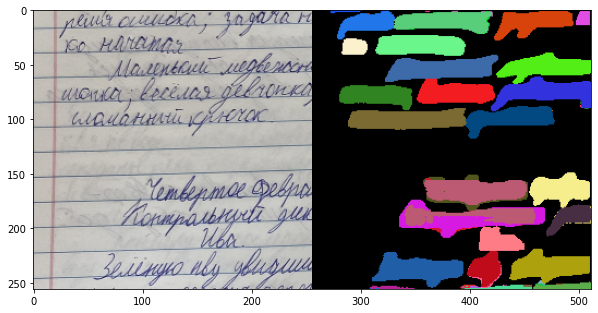


Epoch 2/29
----------


100%|██████████| 98/98 [07:11<00:00,  4.41s/it]


train Loss: {'loss_box_reg': 0.04881557480862395, 'loss_rpn_box_reg': 0.02326397241082431, 'loss_objectness': 0.012506555439844401, 'loss_classifier': 0.029479092938712818, 'loss_mask': 0.03616494247198412, 'loss': 0.15023013723096026} 


100%|██████████| 11/11 [00:51<00:00,  4.66s/it]


test Loss: {'loss_box_reg': 0.04809583398117416, 'loss_rpn_box_reg': 0.02306836021357569, 'loss_objectness': 0.009572063626229078, 'loss_classifier': 0.0282178301920836, 'loss_mask': 0.03549586801693357, 'loss': 0.14444995611563496} 


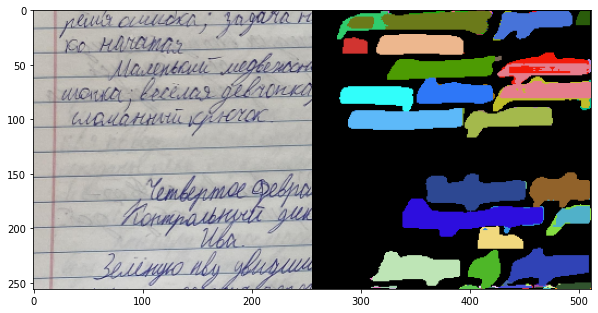


Epoch 3/29
----------


100%|██████████| 98/98 [07:02<00:00,  4.32s/it]


train Loss: {'loss_box_reg': 0.0492956560090702, 'loss_rpn_box_reg': 0.02416544082542184, 'loss_objectness': 0.01382577598114118, 'loss_classifier': 0.029268422258713376, 'loss_mask': 0.03640794564167965, 'loss': 0.15296324009754175} 


100%|██████████| 11/11 [00:51<00:00,  4.67s/it]


test Loss: {'loss_box_reg': 0.047859290893050445, 'loss_rpn_box_reg': 0.025811151868995578, 'loss_objectness': 0.009525972022407356, 'loss_classifier': 0.025483325637620072, 'loss_mask': 0.03408505365081217, 'loss': 0.14276479578566278} 


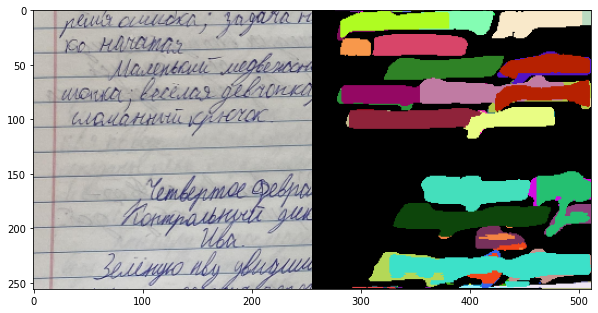


Epoch 4/29
----------


100%|██████████| 98/98 [07:07<00:00,  4.36s/it]


train Loss: {'loss_box_reg': 0.047793913110035884, 'loss_rpn_box_reg': 0.02173582811574985, 'loss_objectness': 0.013995485771039892, 'loss_classifier': 0.028154092444109335, 'loss_mask': 0.03574796492758865, 'loss': 0.1474272845027683} 


100%|██████████| 11/11 [00:48<00:00,  4.43s/it]


test Loss: {'loss_box_reg': 0.042133816699872075, 'loss_rpn_box_reg': 0.02219282784338655, 'loss_objectness': 0.008780789358177405, 'loss_classifier': 0.022595716790221203, 'loss_mask': 0.03226157235003066, 'loss': 0.1279647220140216} 
updated best loss, now it 0.1279647220140216


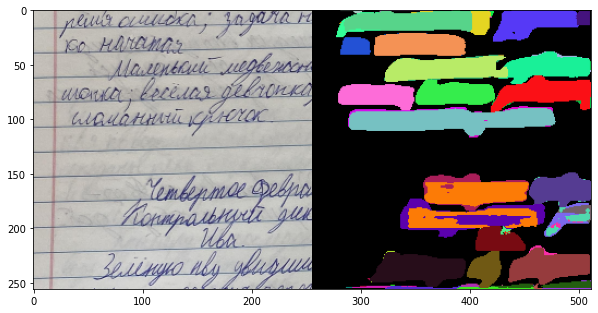


Epoch 5/29
----------


100%|██████████| 98/98 [07:14<00:00,  4.44s/it]


train Loss: {'loss_box_reg': 0.047070525826327744, 'loss_rpn_box_reg': 0.022443128320624624, 'loss_objectness': 0.012457418995052384, 'loss_classifier': 0.028145353862370916, 'loss_mask': 0.03557572539708789, 'loss': 0.14569215240625802} 


100%|██████████| 11/11 [00:49<00:00,  4.46s/it]


test Loss: {'loss_box_reg': 0.04301285709457836, 'loss_rpn_box_reg': 0.020370569808044654, 'loss_objectness': 0.006394666416206579, 'loss_classifier': 0.02397671410407143, 'loss_mask': 0.033684097316073275, 'loss': 0.127438904910252} 
updated best loss, now it 0.127438904910252


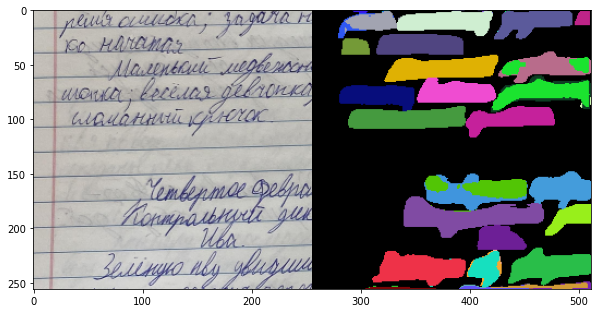


Epoch 6/29
----------


100%|██████████| 98/98 [07:14<00:00,  4.44s/it]


train Loss: {'loss_box_reg': 0.04575317910125664, 'loss_rpn_box_reg': 0.022917036892441095, 'loss_objectness': 0.011846182386042068, 'loss_classifier': 0.026840287381771143, 'loss_mask': 0.035134324504295066, 'loss': 0.14249101024183375} 


100%|██████████| 11/11 [00:52<00:00,  4.80s/it]


test Loss: {'loss_box_reg': 0.040546525141288495, 'loss_rpn_box_reg': 0.02440941068290294, 'loss_objectness': 0.007944999498197403, 'loss_classifier': 0.023157469500070332, 'loss_mask': 0.03234983483950297, 'loss': 0.12840824223112787} 


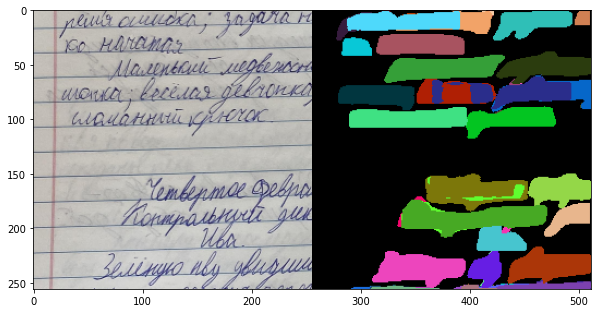


Epoch 7/29
----------


100%|██████████| 98/98 [07:06<00:00,  4.35s/it]


train Loss: {'loss_box_reg': 0.04508298635482788, 'loss_rpn_box_reg': 0.02182652699632841, 'loss_objectness': 0.011033067438976798, 'loss_classifier': 0.026673397636628366, 'loss_mask': 0.034656119757023866, 'loss': 0.13927209906596474} 


100%|██████████| 11/11 [00:52<00:00,  4.74s/it]


test Loss: {'loss_box_reg': 0.03885809494846169, 'loss_rpn_box_reg': 0.023140283836715524, 'loss_objectness': 0.007650450128933479, 'loss_classifier': 0.02099599218231508, 'loss_mask': 0.031324017664481854, 'loss': 0.12196883867526877} 
updated best loss, now it 0.12196883867526877


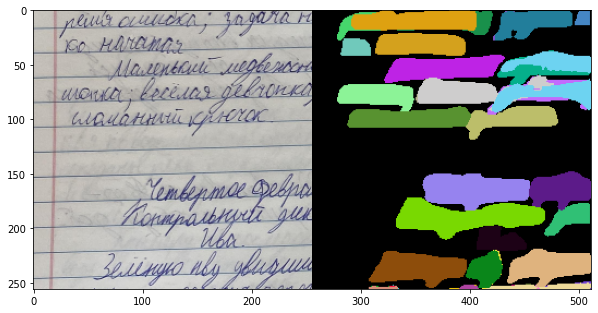


Epoch 8/29
----------


100%|██████████| 98/98 [07:13<00:00,  4.42s/it]


train Loss: {'loss_box_reg': 0.04490271003550084, 'loss_rpn_box_reg': 0.0206612677599856, 'loss_objectness': 0.011433351204815673, 'loss_classifier': 0.026638724072866306, 'loss_mask': 0.034413728762317346, 'loss': 0.13804978101563423} 


100%|██████████| 11/11 [00:52<00:00,  4.79s/it]


test Loss: {'loss_box_reg': 0.04294411718160256, 'loss_rpn_box_reg': 0.02426771853847065, 'loss_objectness': 0.008152713206992752, 'loss_classifier': 0.02617262971812281, 'loss_mask': 0.032523742009853494, 'loss': 0.1340609199699314} 


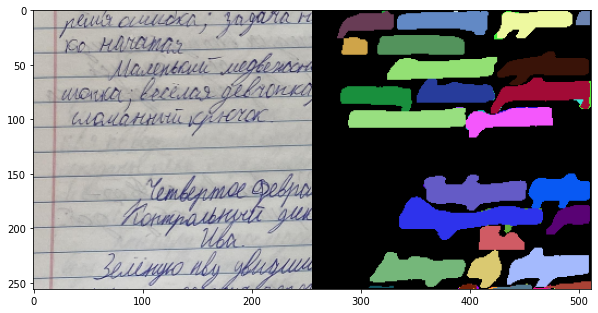


Epoch 9/29
----------


100%|██████████| 98/98 [07:04<00:00,  4.33s/it]


train Loss: {'loss_box_reg': 0.043183547074270065, 'loss_rpn_box_reg': 0.021797216460204646, 'loss_objectness': 0.010644313590445266, 'loss_classifier': 0.026272441256920805, 'loss_mask': 0.0341839062737989, 'loss': 0.1360814254563134} 


100%|██████████| 11/11 [00:47<00:00,  4.31s/it]


test Loss: {'loss_box_reg': 0.038993656292728995, 'loss_rpn_box_reg': 0.021683999005405383, 'loss_objectness': 0.007638121644655864, 'loss_classifier': 0.023974253699697298, 'loss_mask': 0.03189520572108784, 'loss': 0.12418523602101994} 


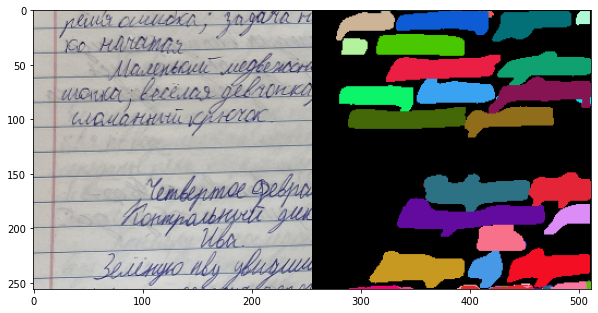


Epoch 10/29
----------


100%|██████████| 98/98 [07:13<00:00,  4.42s/it]


train Loss: {'loss_box_reg': 0.04339261665614262, 'loss_rpn_box_reg': 0.02209290737907092, 'loss_objectness': 0.010599503741914854, 'loss_classifier': 0.026560836508774235, 'loss_mask': 0.034020870693862205, 'loss': 0.1366667348599035} 


100%|██████████| 11/11 [00:50<00:00,  4.55s/it]


test Loss: {'loss_box_reg': 0.03875888010551189, 'loss_rpn_box_reg': 0.022205919626800494, 'loss_objectness': 0.007045804597865576, 'loss_classifier': 0.02242919854049025, 'loss_mask': 0.0315588416381814, 'loss': 0.12199864784876506} 


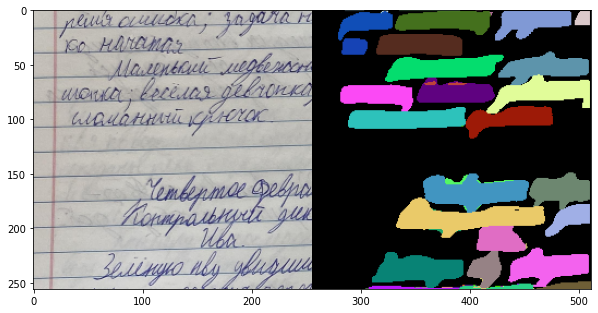


Epoch 11/29
----------


100%|██████████| 98/98 [07:09<00:00,  4.39s/it]


train Loss: {'loss_box_reg': 0.043110349166423964, 'loss_rpn_box_reg': 0.019898837357351946, 'loss_objectness': 0.009854560950471321, 'loss_classifier': 0.026208262415926428, 'loss_mask': 0.034211227658325793, 'loss': 0.13328323753950985} 


100%|██████████| 11/11 [00:51<00:00,  4.67s/it]


test Loss: {'loss_box_reg': 0.0392831046690886, 'loss_rpn_box_reg': 0.018821402442181247, 'loss_objectness': 0.006416514258960198, 'loss_classifier': 0.022687444227865373, 'loss_mask': 0.031751189252425885, 'loss': 0.11895965502179902} 
updated best loss, now it 0.11895965502179902


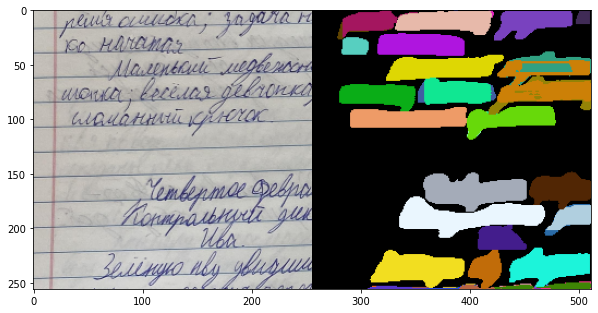


Epoch 12/29
----------


100%|██████████| 98/98 [07:13<00:00,  4.43s/it]


train Loss: {'loss_box_reg': 0.043420676827584145, 'loss_rpn_box_reg': 0.023590284002947225, 'loss_objectness': 0.011194673317701506, 'loss_classifier': 0.026299881294580652, 'loss_mask': 0.03411664791702457, 'loss': 0.13862216288518722} 


100%|██████████| 11/11 [00:50<00:00,  4.57s/it]


test Loss: {'loss_box_reg': 0.03938793999025191, 'loss_rpn_box_reg': 0.02206906265225904, 'loss_objectness': 0.005745624973513614, 'loss_classifier': 0.02305621199909298, 'loss_mask': 0.03189135642572381, 'loss': 0.12215019437088363} 


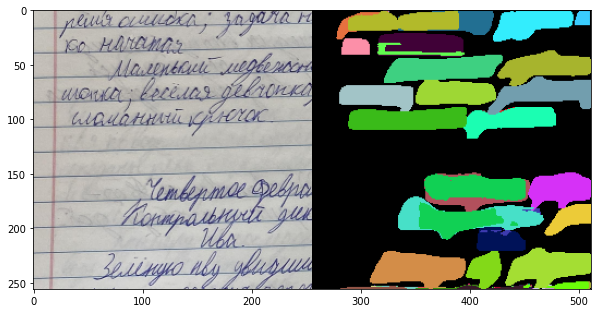


Epoch 13/29
----------


100%|██████████| 98/98 [07:11<00:00,  4.41s/it]


train Loss: {'loss_box_reg': 0.044185517108885325, 'loss_rpn_box_reg': 0.022925821683121465, 'loss_objectness': 0.011320347059877682, 'loss_classifier': 0.026538405658502223, 'loss_mask': 0.03446840541856783, 'loss': 0.13943849728374408} 


100%|██████████| 11/11 [00:50<00:00,  4.57s/it]


test Loss: {'loss_box_reg': 0.038274581062382663, 'loss_rpn_box_reg': 0.01889086146464293, 'loss_objectness': 0.006374284475185405, 'loss_classifier': 0.023058443233884614, 'loss_mask': 0.03154920435499871, 'loss': 0.11814737662501719} 
updated best loss, now it 0.11814737662501719


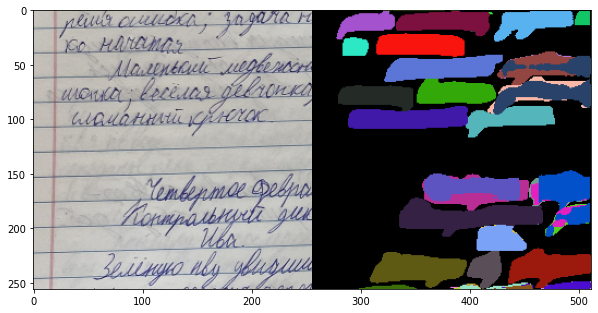


Epoch 14/29
----------


100%|██████████| 98/98 [07:09<00:00,  4.38s/it]


train Loss: {'loss_box_reg': 0.042434449399913754, 'loss_rpn_box_reg': 0.02116889914106985, 'loss_objectness': 0.010795054135021862, 'loss_classifier': 0.025263622882590177, 'loss_mask': 0.03379144512855255, 'loss': 0.13345347047619224} 


100%|██████████| 11/11 [00:49<00:00,  4.52s/it]


test Loss: {'loss_box_reg': 0.037050776783077194, 'loss_rpn_box_reg': 0.018806712466409838, 'loss_objectness': 0.006603380943509354, 'loss_classifier': 0.020168026117072708, 'loss_mask': 0.031570598996918775, 'loss': 0.1141994965487513} 
updated best loss, now it 0.1141994965487513


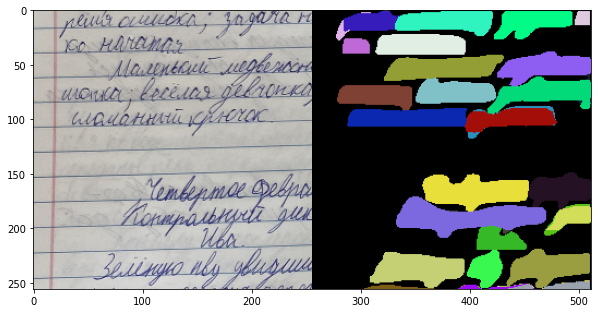


Epoch 15/29
----------


100%|██████████| 98/98 [07:20<00:00,  4.50s/it]


train Loss: {'loss_box_reg': 0.04286683833123481, 'loss_rpn_box_reg': 0.02153015062404722, 'loss_objectness': 0.010846014883719203, 'loss_classifier': 0.025756986291558894, 'loss_mask': 0.033636013551721855, 'loss': 0.1346360038452934} 


100%|██████████| 11/11 [00:51<00:00,  4.73s/it]


test Loss: {'loss_box_reg': 0.03776609846230211, 'loss_rpn_box_reg': 0.022168673146730183, 'loss_objectness': 0.0072931364264296385, 'loss_classifier': 0.02166046887293629, 'loss_mask': 0.03169489061010295, 'loss': 0.1205832663623766} 


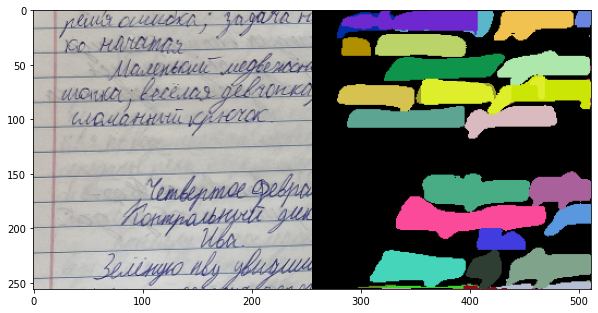


Epoch 16/29
----------


100%|██████████| 98/98 [07:13<00:00,  4.42s/it]


train Loss: {'loss_box_reg': 0.042908581642570644, 'loss_rpn_box_reg': 0.020957546306239437, 'loss_objectness': 0.010619892241334977, 'loss_classifier': 0.026145367989822397, 'loss_mask': 0.03399861148502222, 'loss': 0.13462999988553453} 


100%|██████████| 11/11 [00:51<00:00,  4.71s/it]


test Loss: {'loss_box_reg': 0.0405304486724152, 'loss_rpn_box_reg': 0.026944147273041737, 'loss_objectness': 0.0072554233858640165, 'loss_classifier': 0.022721958057633763, 'loss_mask': 0.03190516534892992, 'loss': 0.1293571426950652} 


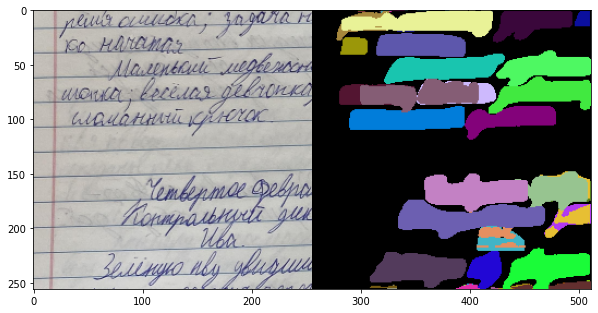


Epoch 17/29
----------


100%|██████████| 98/98 [07:07<00:00,  4.37s/it]


train Loss: {'loss_box_reg': 0.0420484176166883, 'loss_rpn_box_reg': 0.019608918726060687, 'loss_objectness': 0.010340639537480807, 'loss_classifier': 0.024885876797034166, 'loss_mask': 0.033583602619907574, 'loss': 0.13046745551292194} 


100%|██████████| 11/11 [00:48<00:00,  4.44s/it]


test Loss: {'loss_box_reg': 0.039880712827046715, 'loss_rpn_box_reg': 0.01955511545141538, 'loss_objectness': 0.007532269875893648, 'loss_classifier': 0.020956694394692606, 'loss_mask': 0.03157825408310726, 'loss': 0.11950304727444704} 


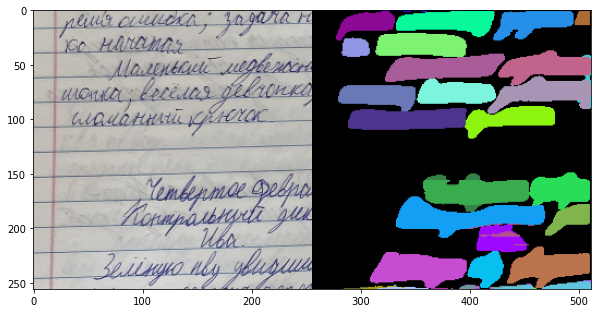


Epoch 18/29
----------


100%|██████████| 98/98 [07:15<00:00,  4.45s/it]


train Loss: {'loss_box_reg': 0.041806485873084887, 'loss_rpn_box_reg': 0.020043085200982972, 'loss_objectness': 0.010069138889453893, 'loss_classifier': 0.02449381328457571, 'loss_mask': 0.033088255055162434, 'loss': 0.1295007778717591} 


100%|██████████| 11/11 [00:50<00:00,  4.55s/it]


test Loss: {'loss_box_reg': 0.03958915328157359, 'loss_rpn_box_reg': 0.018663761345134384, 'loss_objectness': 0.006918542001439237, 'loss_classifier': 0.02233411885541061, 'loss_mask': 0.03078932563463847, 'loss': 0.11829490017616885} 


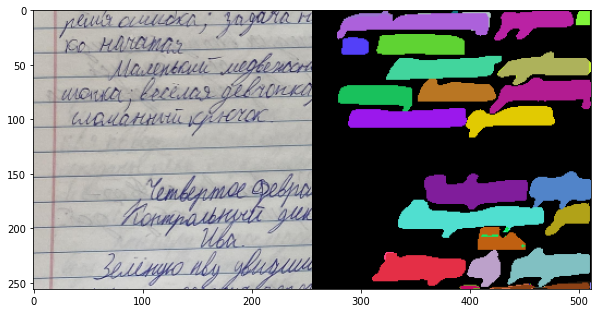


Epoch 19/29
----------


100%|██████████| 98/98 [07:15<00:00,  4.44s/it]


train Loss: {'loss_box_reg': 0.03930886774449735, 'loss_rpn_box_reg': 0.019266858183931045, 'loss_objectness': 0.009069740261638027, 'loss_classifier': 0.024316896323685173, 'loss_mask': 0.03204898089362234, 'loss': 0.12401134358716594} 


100%|██████████| 11/11 [00:50<00:00,  4.60s/it]


test Loss: {'loss_box_reg': 0.03401235619495655, 'loss_rpn_box_reg': 0.017266671034111374, 'loss_objectness': 0.006505070639581516, 'loss_classifier': 0.02040674528856387, 'loss_mask': 0.029731226035918313, 'loss': 0.10792206758740304} 
updated best loss, now it 0.10792206758740304


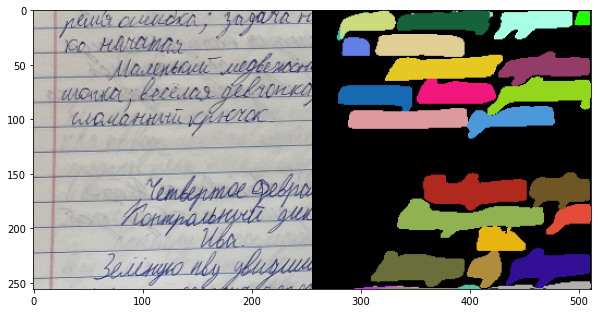


Epoch 20/29
----------


100%|██████████| 98/98 [07:18<00:00,  4.48s/it]


train Loss: {'loss_box_reg': 0.0385802779035065, 'loss_rpn_box_reg': 0.02178393025071081, 'loss_objectness': 0.009327917063711846, 'loss_classifier': 0.023369405643973724, 'loss_mask': 0.03199440212093265, 'loss': 0.1250559326304432} 


100%|██████████| 11/11 [00:51<00:00,  4.71s/it]


test Loss: {'loss_box_reg': 0.03531807900845319, 'loss_rpn_box_reg': 0.018431900904096406, 'loss_objectness': 0.005533524242968395, 'loss_classifier': 0.020069353368090487, 'loss_mask': 0.03018080263302244, 'loss': 0.10953366071328349} 


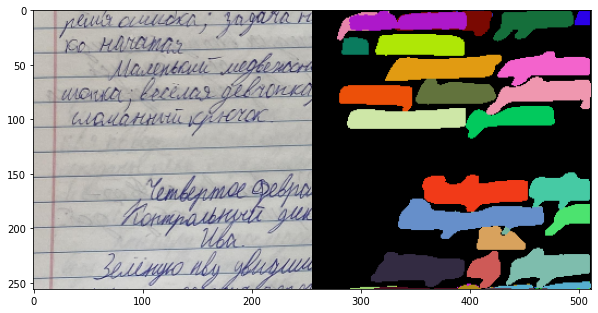


Epoch 21/29
----------


100%|██████████| 98/98 [07:11<00:00,  4.41s/it]


train Loss: {'loss_box_reg': 0.03799478489152867, 'loss_rpn_box_reg': 0.01901788888271404, 'loss_objectness': 0.00851460358312538, 'loss_classifier': 0.02290573700821384, 'loss_mask': 0.031568281400464526, 'loss': 0.12000129535851792} 


100%|██████████| 11/11 [00:52<00:00,  4.73s/it]


test Loss: {'loss_box_reg': 0.033997818656351375, 'loss_rpn_box_reg': 0.020046460559998435, 'loss_objectness': 0.006130615399144162, 'loss_classifier': 0.02021904443872386, 'loss_mask': 0.02878893654921959, 'loss': 0.10918287710211742} 


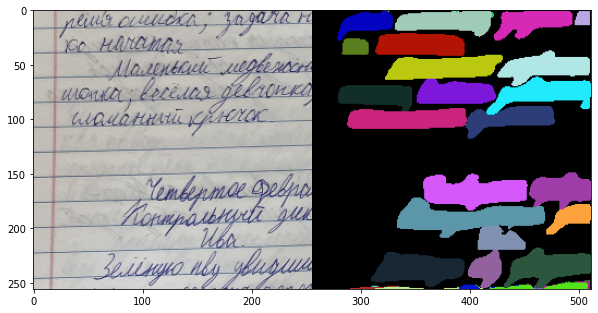


Epoch 22/29
----------


100%|██████████| 98/98 [07:08<00:00,  4.37s/it]


train Loss: {'loss_box_reg': 0.03821444152788459, 'loss_rpn_box_reg': 0.020551698951187282, 'loss_objectness': 0.008954354467174875, 'loss_classifier': 0.022579628000925254, 'loss_mask': 0.031712828973545534, 'loss': 0.12201295265666613} 


100%|██████████| 11/11 [00:50<00:00,  4.57s/it]


test Loss: {'loss_box_reg': 0.033815984582078865, 'loss_rpn_box_reg': 0.01590232679556156, 'loss_objectness': 0.005823424835314696, 'loss_classifier': 0.01896244715685132, 'loss_mask': 0.030216749543431162, 'loss': 0.1047209323137656} 
updated best loss, now it 0.1047209323137656


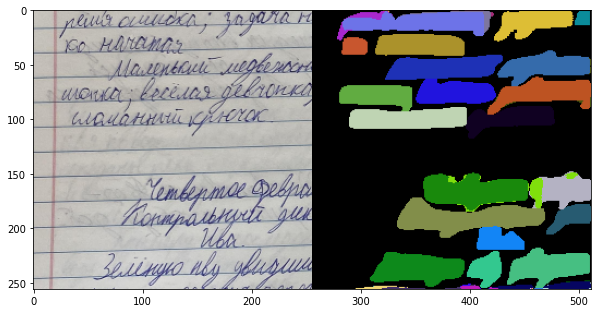


Epoch 23/29
----------


100%|██████████| 98/98 [07:10<00:00,  4.39s/it]


train Loss: {'loss_box_reg': 0.037542441119098297, 'loss_rpn_box_reg': 0.019415161290722616, 'loss_objectness': 0.008088681890007152, 'loss_classifier': 0.022393864659805862, 'loss_mask': 0.031375587715298664, 'loss': 0.11881573726465036} 


100%|██████████| 11/11 [00:51<00:00,  4.67s/it]


test Loss: {'loss_box_reg': 0.03486272829702531, 'loss_rpn_box_reg': 0.02114347368478775, 'loss_objectness': 0.006454295682153483, 'loss_classifier': 0.020276609679748273, 'loss_mask': 0.03013039183342594, 'loss': 0.11286749990507104} 


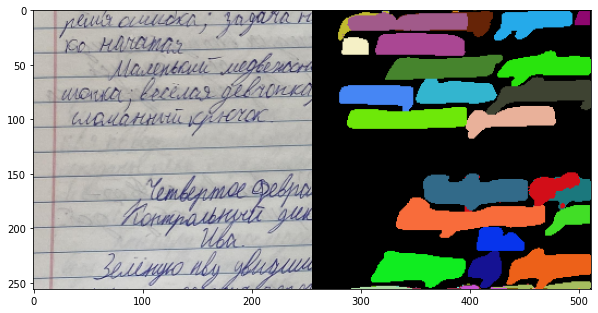


Epoch 24/29
----------


100%|██████████| 98/98 [07:09<00:00,  4.38s/it]


train Loss: {'loss_box_reg': 0.03723092411705886, 'loss_rpn_box_reg': 0.0192028054802114, 'loss_objectness': 0.007675637633682371, 'loss_classifier': 0.022294169668218497, 'loss_mask': 0.031700877091599244, 'loss': 0.11810441443665454} 


100%|██████████| 11/11 [00:48<00:00,  4.38s/it]


test Loss: {'loss_box_reg': 0.03367555364110004, 'loss_rpn_box_reg': 0.017329846176950412, 'loss_objectness': 0.005048744551751806, 'loss_classifier': 0.019731271284065027, 'loss_mask': 0.029480411746036047, 'loss': 0.10526582632941761} 


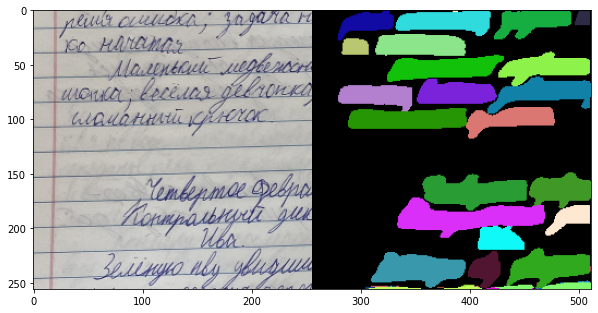


Epoch 25/29
----------


100%|██████████| 98/98 [07:10<00:00,  4.39s/it]


train Loss: {'loss_box_reg': 0.03698884775356283, 'loss_rpn_box_reg': 0.019292059470749575, 'loss_objectness': 0.007851967993198367, 'loss_classifier': 0.022208460931458836, 'loss_mask': 0.031802053809012534, 'loss': 0.11814339058126108} 


100%|██████████| 11/11 [00:49<00:00,  4.51s/it]


test Loss: {'loss_box_reg': 0.03333815932273865, 'loss_rpn_box_reg': 0.019473762090863853, 'loss_objectness': 0.005839560994471626, 'loss_classifier': 0.019241536657015484, 'loss_mask': 0.030020048049674636, 'loss': 0.10791306454559853} 


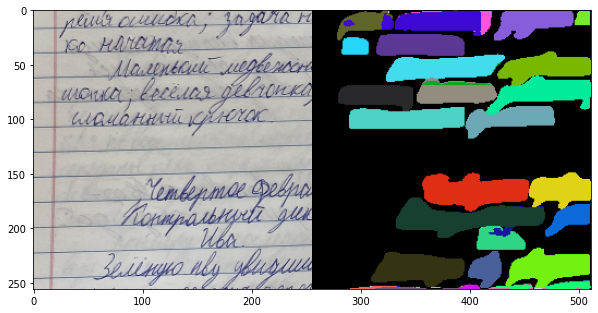


Epoch 26/29
----------


100%|██████████| 98/98 [07:12<00:00,  4.41s/it]


train Loss: {'loss_box_reg': 0.036987442499268774, 'loss_rpn_box_reg': 0.018462114971001635, 'loss_objectness': 0.0074985579802070955, 'loss_classifier': 0.021901225635213743, 'loss_mask': 0.03141806641907612, 'loss': 0.11626740733935872} 


100%|██████████| 11/11 [00:50<00:00,  4.56s/it]


test Loss: {'loss_box_reg': 0.03392487730102978, 'loss_rpn_box_reg': 0.021194464858921094, 'loss_objectness': 0.004567273560611681, 'loss_classifier': 0.019816652968012053, 'loss_mask': 0.029816252746801268, 'loss': 0.1093195217779313} 


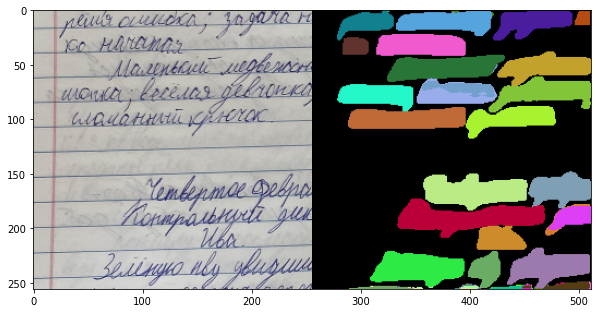


Epoch 27/29
----------


100%|██████████| 98/98 [07:12<00:00,  4.42s/it]


train Loss: {'loss_box_reg': 0.03690055758719892, 'loss_rpn_box_reg': 0.019074831949007557, 'loss_objectness': 0.008310036767307703, 'loss_classifier': 0.021814293123810446, 'loss_mask': 0.031378776026815366, 'loss': 0.11747849532229253} 


100%|██████████| 11/11 [00:51<00:00,  4.64s/it]


test Loss: {'loss_box_reg': 0.03332319050684743, 'loss_rpn_box_reg': 0.017599817322588515, 'loss_objectness': 0.004707579597316939, 'loss_classifier': 0.019515250863014966, 'loss_mask': 0.029530399489676815, 'loss': 0.10467623773662524} 
updated best loss, now it 0.10467623773662524


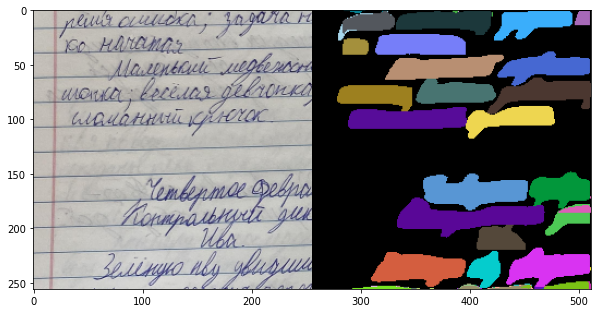


Epoch 28/29
----------


100%|██████████| 98/98 [07:20<00:00,  4.49s/it]


train Loss: {'loss_box_reg': 0.037260562123939335, 'loss_rpn_box_reg': 0.018775195540186675, 'loss_objectness': 0.008160187909559394, 'loss_classifier': 0.021948492080165, 'loss_mask': 0.031584578706490944, 'loss': 0.1177290161757549} 


100%|██████████| 11/11 [00:50<00:00,  4.59s/it]


test Loss: {'loss_box_reg': 0.03373359777461523, 'loss_rpn_box_reg': 0.014517146837094734, 'loss_objectness': 0.0045796733178283975, 'loss_classifier': 0.01901725636816573, 'loss_mask': 0.030231834314335352, 'loss': 0.10207951000367088} 
updated best loss, now it 0.10207951000367088


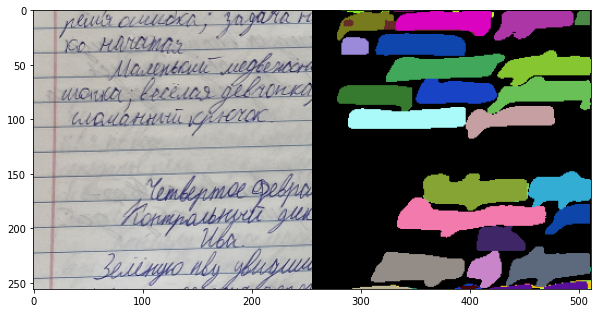


Epoch 29/29
----------


100%|██████████| 98/98 [07:13<00:00,  4.42s/it]


train Loss: {'loss_box_reg': 0.03691133877868971, 'loss_rpn_box_reg': 0.020962328121468827, 'loss_objectness': 0.008431319080226056, 'loss_classifier': 0.021875101703781267, 'loss_mask': 0.03121446730854275, 'loss': 0.119394554901614} 


100%|██████████| 11/11 [00:52<00:00,  4.80s/it]


test Loss: {'loss_box_reg': 0.03385329366415397, 'loss_rpn_box_reg': 0.020666296112126316, 'loss_objectness': 0.005796055470047326, 'loss_classifier': 0.020040677539233505, 'loss_mask': 0.028991070286980992, 'loss': 0.10934739345791696} 


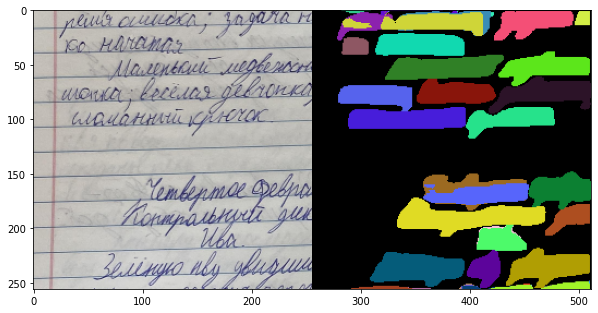

In [ ]:
history = train_model(model, train_loader, val_loader, None, optimizer, lr_scheduler, 30, 'mask_rcnn_small_2')

In [ ]:
train_epoch(model, val_loader, None, optimizer, False) #small

100%|██████████| 11/11 [00:50<00:00,  4.55s/it]


{'loss_box_reg': 0.03346906499616031,
 'loss_classifier': 0.018653497356792975,
 'loss_mask': 0.029057649874139106,
 'loss_objectness': 0.00454699074656799,
 'loss_rpn_box_reg': 0.015481248326685237,
 'losses': 0.10120845183558848}

In [ ]:
np.random.seed(42)
train_epoch(model, val_loader, None, optimizer, False) #small_2

100%|██████████| 11/11 [00:49<00:00,  4.50s/it]


{'loss_box_reg': 0.10271188719519253,
 'loss_classifier': 0.018199232546077377,
 'loss_mask': 0.029629015545735413,
 'loss_objectness': 0.006473598123966962,
 'loss_rpn_box_reg': 0.051671032590427615,
 'losses': 0.2086847677998159}

In [ ]:
np.random.seed(42)
train_epoch(model, val_loader, None, optimizer, False) #small_2_best

100%|██████████| 11/11 [00:53<00:00,  4.89s/it]


{'loss': 0.10948950394816782,
 'loss_box_reg': 0.033656444700284935,
 'loss_classifier': 0.02024914752477887,
 'loss_mask': 0.030010641306296163,
 'loss_objectness': 0.005695996035275788,
 'loss_rpn_box_reg': 0.019877273974747492}